# TAO Ri analysis

Analysis of bulk & gradient Ri with TAO data

In [ ]:
%load_ext watermark

import dask
import dcpy
import distributed
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
import cf_xarray

import pump

dask.config.set({"array.slicing.split_large_chunks": True})
mpl.rcParams["figure.dpi"] = 140 

%watermark -iv

distributed: 2022.6.1
numpy      : 1.22.4
pump       : 0.1
dcpy       : 0.1.dev360+g65bcf1a
cf_xarray  : 0.7.2
dask       : 2022.6.1
json       : 2.0.9
sys        : 3.10.5 | packaged by conda-forge | (main, Jun 14 2022, 07:04:59) [GCC 10.3.0]
xarray     : 2022.3.0
matplotlib : 3.5.2



/glade/u/home/dcherian/miniconda3/envs/pump/lib/python3.10/site-packages/dask_jobqueue/core.py:20: FutureWarning: tmpfile is deprecated and will be removed in a future release. Please use dask.utils.tmpfile instead.
  from distributed.utils import tmpfile


## Next steps

1. [x] Make a merged velocity dataset
2. [ ] Add 147E to merged dataset
2. Try the Pham extrapolation
   - no since I just ignore the near-surface
3. [x] Do something about eucmax in El-Nino years
4. [x] eucmax = 25 before 1996?
5. [x] eucmax at 156E, 165E
6. 165E doesn't really have much data at all
7. [x] deal with euc shoaling
8. Where is the high-res Ucur, Vcur for 2012-ish? It's present in the daily data
9. [x] I need to interpolate the density field to get a good dens_euc

I will need to
1. Recalculate bulk Ri stuff. This really shouldn't change much?
2. Scatter median gradient Ri against the new bulk Ri
3. What the heck is going on at 195W. Marginal stability?
   - barrier & isothermal layers



## Ri_g quantile analysis

In [ ]:
Ri_q_old = xr.open_dataset("tao-hourly-Ri-seasonal-percentiles-before-salinity.nc")
Ri_q_old

<xarray.Dataset>
Dimensions:    (longitude: 5, quantile: 3, season: 4, zeuc: 59)
Coordinates:
  * season     (season) object 'DJF' 'MAM' 'JJA' 'SON'
  * longitude  (longitude) float64 -204.0 -195.0 -170.0 -140.0 -110.0
  * zeuc       (zeuc) float64 -47.5 -42.5 -37.5 -32.5 ... 232.5 237.5 242.5
  * quantile   (quantile) float64 0.25 0.5 0.75
    latitude   float32 ...
    num_obs    (season, longitude, zeuc) int64 ...
Data variables:
    Rig        (season, longitude, zeuc, quantile) float64 ...

In [ ]:
Ri_q = xr.open_dataset("tao-hourly-Ri-seasonal-percentiles-2.nc")
Ri_q

In [ ]:
Ri = xr.concat(
    [
        Ri_q_old.Rig,
        Ri_q.Rig_T,
        Ri_q.Ri,
    ],
    dim="kind",
)
counts = xr.concat(
    [
        Ri_q_old.num_obs.reset_coords(drop=True),
        Ri_q.num_Rig_T.reset_coords(drop=True),
        Ri_q.num_Rig.reset_coords(drop=True),
    ],
    dim="kind",
)
counts["kind"] = ["$Ri^T_{old}$", "$Ri_g^T$", "$Ri_g$"]
counts.name = "count"

merged = xr.Dataset()
merged["Rig"] = Ri
merged["counts"] = counts
merged = merged.reindex(season=["DJF", "MAM", "JJA", "SON"])
merged

<xarray.Dataset>
Dimensions:             (kind: 3, longitude: 5, quantile: 3, season: 4, zeuc: 59)
Coordinates:
  * season              (season) <U3 'DJF' 'MAM' 'JJA' 'SON'
  * kind                (kind) object '$Ri^T_{old}$' '$Ri_g^T$' '$Ri_g$'
    reference_pressure  int64 0
    num_Rig_T           (season, longitude, zeuc) int64 2949 3436 3665 ... 0 0 0
    num_Rig             (season, longitude, zeuc) int64 169 352 545 ... 0 0 0
  * longitude           (longitude) float64 -204.0 -195.0 -170.0 -140.0 -110.0
  * zeuc                (zeuc) float64 -47.5 -42.5 -37.5 ... 232.5 237.5 242.5
  * quantile            (quantile) float64 0.25 0.5 0.75
    latitude            float32 0.0
    num_obs             (season, longitude, zeuc) int64 2956 3450 3685 ... 0 0 0
Data variables:
    Rig                 (kind, season, longitude, zeuc, quantile) float64 0.8...
    counts              (kind, season, longitude, zeuc) int64 2956 3450 ... 0 0

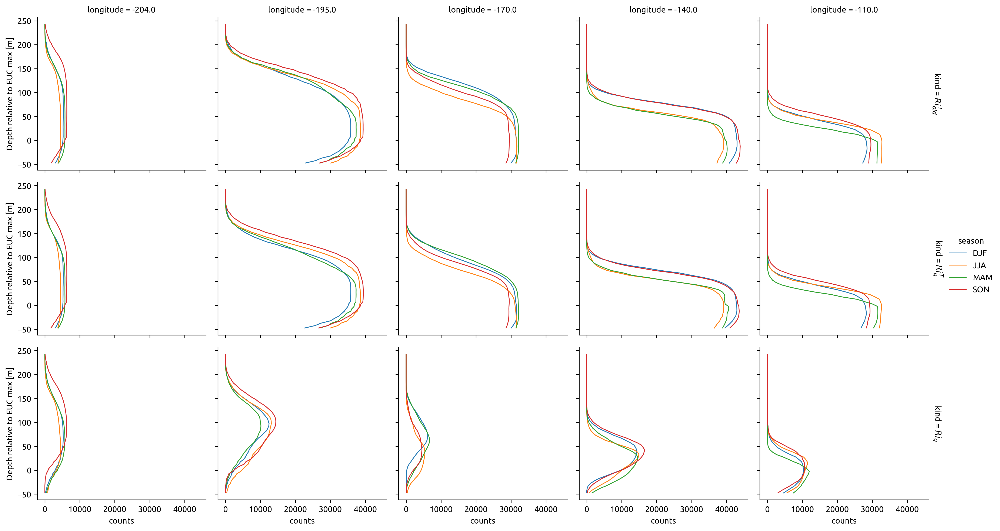

In [ ]:
merged.counts.plot.line(hue="season", row="kind", y="zeuc", col="longitude", xscale="linear")

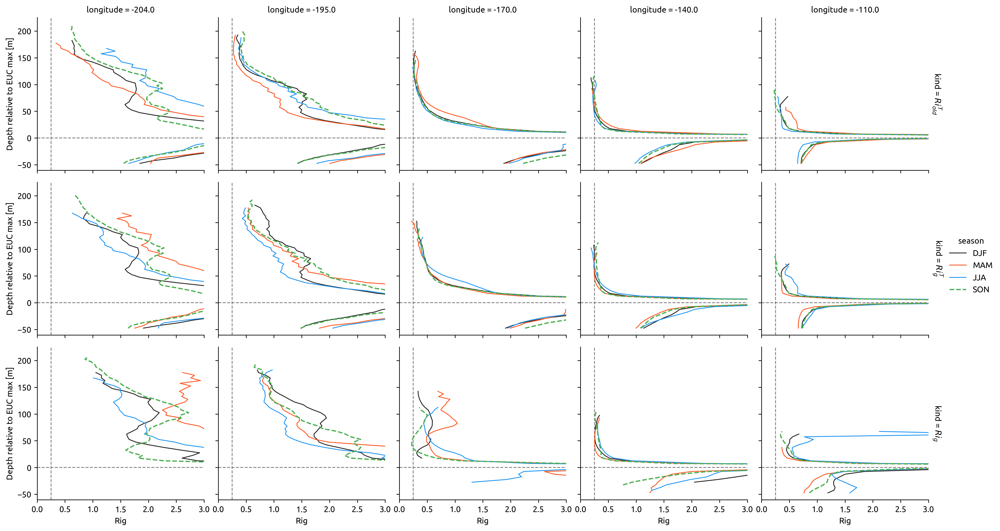

In [ ]:
with mpl.rc_context(pump.plot.sm13_cycler):
    fg = (
        merged.Rig.isel(quantile=1)
        .where(merged.counts > 1000)
        .plot.line(hue="season", row="kind", y="zeuc", col="longitude", xlim=(0, 3))
    )

fg.map(lambda: dcpy.plots.linex(0.25))
fg.map(lambda: dcpy.plots.liney(0))

## Argo: How "important" is salinity to N²


In [ ]:
argo = dcpy.oceans.read_argo_clim()
argo

<xarray.Dataset>
Dimensions:          (lat: 145, lon: 360, pres: 58, time: 180)
Coordinates:
  * lon              (lon) float32 20.5 21.5 22.5 23.5 ... 377.5 378.5 379.5
  * lat              (lat) float32 -64.5 -63.5 -62.5 -61.5 ... 77.5 78.5 79.5
  * pres             (pres) float32 2.5 10.0 20.0 ... 1.8e+03 1.9e+03 1.975e+03
  * time             (time) datetime64[ns] 2004-01-16 2004-02-15 ... 2018-09-29
Data variables:
    Tmean            (pres, lat, lon) float32 dask.array<chunksize=(58, 20, 60), meta=np.ndarray>
    Tanom            (time, pres, lat, lon) float32 dask.array<chunksize=(180, 58, 20, 60), meta=np.ndarray>
    BATHYMETRY_MASK  (pres, lat, lon) float32 dask.array<chunksize=(58, 20, 60), meta=np.ndarray>
    MAPPING_MASK     (pres, lat, lon) float32 dask.array<chunksize=(58, 20, 60), meta=np.ndarray>
    T                (time, pres, lat, lon) float32 dask.array<chunksize=(180, 58, 20, 60), meta=np.ndarray>
    Smean            (pres, lat, lon) float32 dask.array<chunksize=(58, 20, 60), meta=np.ndarray>
    Sanom            (time, pres, lat, lon) float32 dask.array<chunksize=(180, 58, 20, 60), meta=np.ndarray>
    S                (time, pres, lat, lon) float32 dask.array<chunksize=(180, 58, 20, 60), meta=np.ndarray>

In [ ]:
argo0 = (
    argo.cf.interp(latitude=0, longitude=360 + np.array([-195, -170, -140, -110]))
    .assign_coords(lon=np.array([-195, -170, -140, -110]))
    .load()
)
argo0["dens"] = dcpy.eos.pden(argo0.S, argo0.T, 0)
N2 = 9.81/1025 * argo0.dens.cf.differentiate("Z")
argo0

<xarray.Dataset>
Dimensions:             (lon: 4, pres: 58, time: 180)
Coordinates:
  * pres                (pres) float32 2.5 10.0 20.0 ... 1.9e+03 1.975e+03
  * time                (time) datetime64[ns] 2004-01-16 ... 2018-09-29
  * lon                 (lon) int64 -195 -170 -140 -110
    lat                 int64 0
    reference_pressure  int64 0
Data variables:
    Tmean               (pres, lon) float64 29.55 28.08 26.04 ... 2.305 2.318
    Tanom               (time, pres, lon) float64 0.5328 0.2495 ... -0.03075
    BATHYMETRY_MASK     (pres, lon) float64 1.0 1.0 1.0 1.0 ... 1.0 1.0 1.0 1.0
    MAPPING_MASK        (pres, lon) float64 2e+03 2e+03 2e+03 ... 2e+03 2e+03
    T                   (time, pres, lon) float64 30.09 28.33 ... 2.34 2.287
    Smean               (pres, lon) float64 34.77 35.2 35.11 ... 34.64 34.64
    Sanom               (time, pres, lon) float64 -0.3855 -0.1468 ... 0.00375
    S                   (time, pres, lon) float64 34.38 35.05 ... 34.64 34.64
    dens                (time, pres, lon) float64 1.021e+03 ... 1.028e+03

In [ ]:
N2T = 9.81/1025 * dcpy.eos.pden(35, argo0.T, 0).differentiate("pres")
N2S = 9.81/1025 * dcpy.eos.pden(argo0.S, 27, 0).differentiate("pres")

{'hue': 'lon', 'ylim': (250, 0), 'ax': <AxesSubplot:>, 'x': None, 'y': 'pres', 'yincrease': False}
{'hue': 'lon', 'ylim': (250, 0), 'ax': <AxesSubplot:>, 'x': None, 'y': 'pres', 'yincrease': False}


Text(0.5, 0, '$N_T^2/N²$')

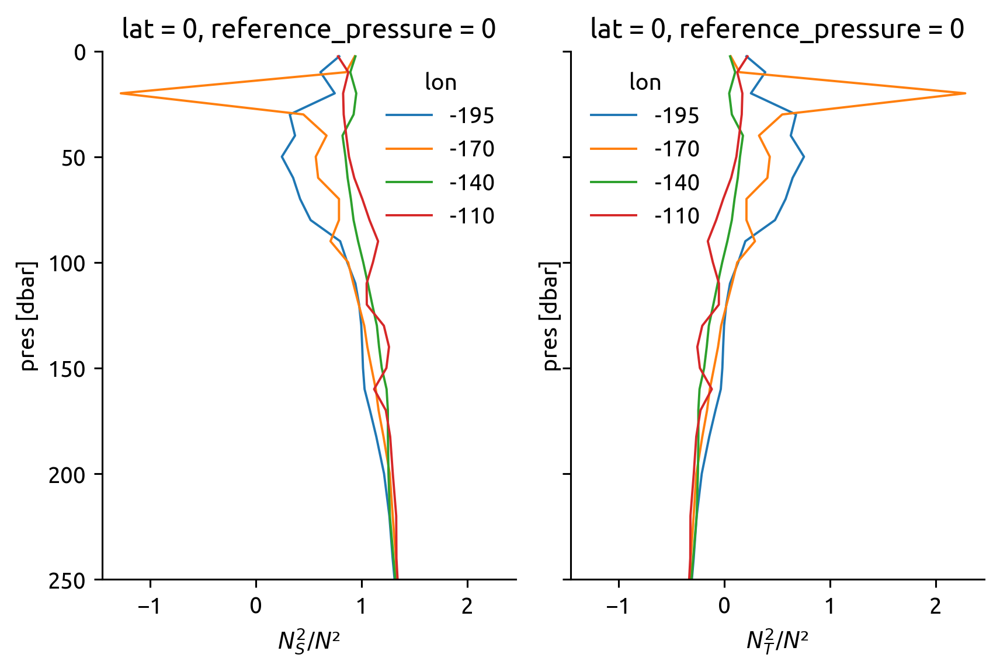

In [ ]:
f, ax = plt.subplots(1, 2, sharex=True, sharey=True, constrained_layout=True)
(N2T/N2).mean("time").cf.plot(hue="lon", ylim=(250, 0), ax=ax[0])
(N2S/N2).mean("time").cf.plot(hue="lon", ylim=(250, 0), ax=ax[1])

ax[0].set_xlabel("$N_S^2/N²$")
ax[1].set_xlabel("$N_T^2/N²$")

{'hue': 'lon', 'ylim': (250, 0), 'x': None, 'y': 'pres', 'yincrease': False}


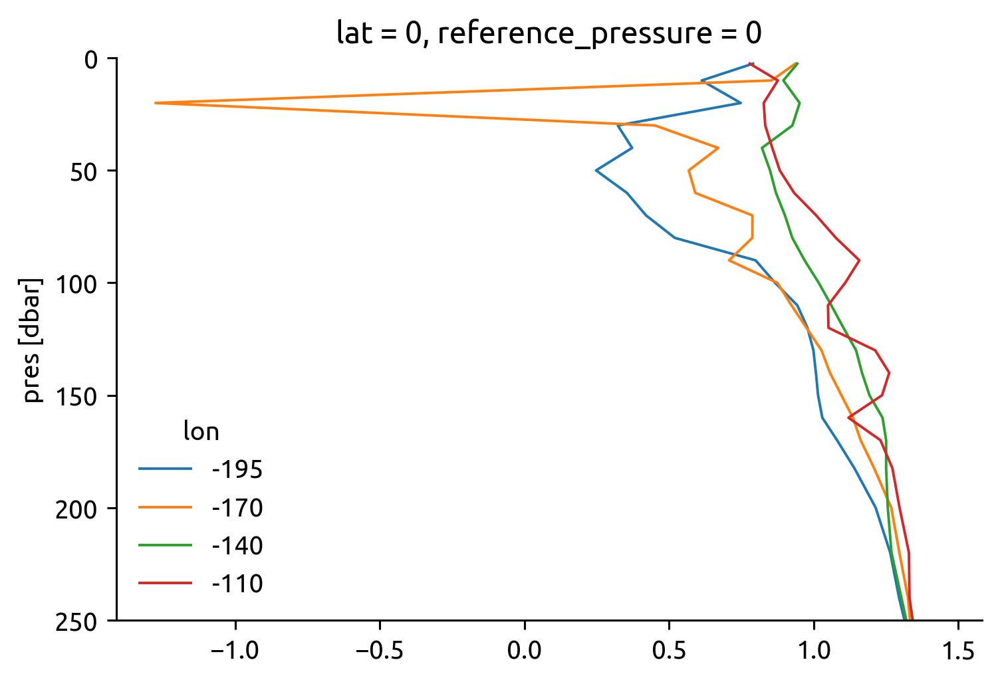

In [ ]:
(N2T/N2).mean("time").cf.plot(hue="lon", ylim=(250, 0))

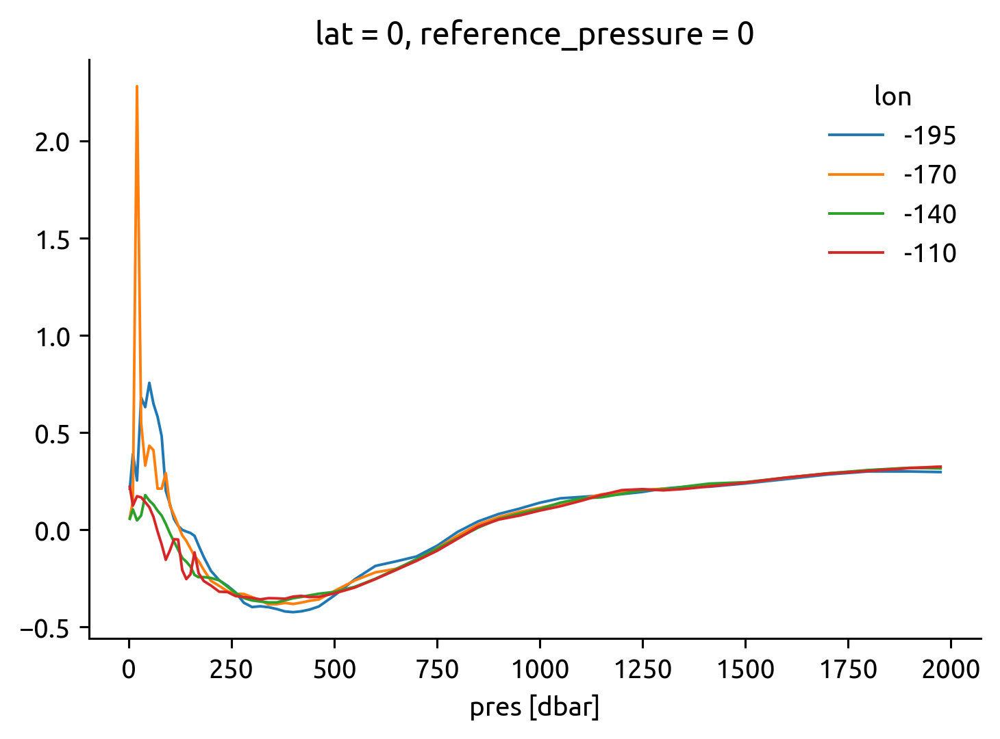

In [ ]:
(N2S/N2).mean("time").cf.plot(hue="lon")

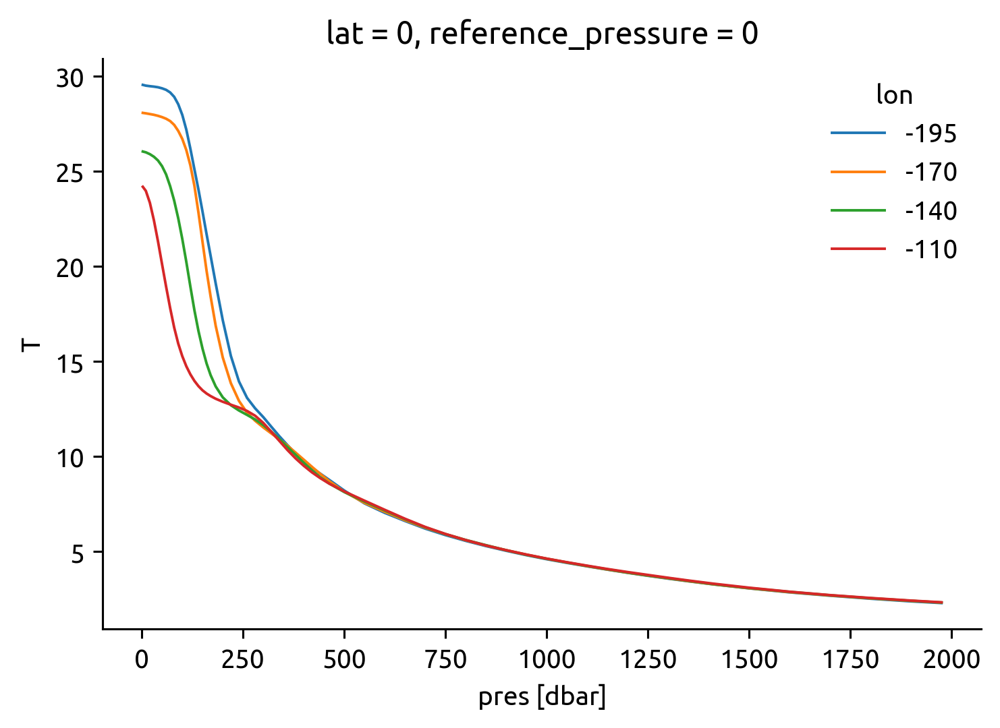

In [ ]:
argo0.T.mean("time").cf.plot(hue="lon")

In [ ]:
N2.mean("time").cf["pres"]

<xarray.DataArray 'pres' (pres: 58)>
array([   2.5,   10. ,   20. ,   30. ,   40. ,   50. ,   60. ,   70. ,   80. ,
         90. ,  100. ,  110. ,  120. ,  130. ,  140. ,  150. ,  160. ,  170. ,
        182.5,  200. ,  220. ,  240. ,  260. ,  280. ,  300. ,  320. ,  340. ,
        360. ,  380. ,  400. ,  420. ,  440. ,  462.5,  500. ,  550. ,  600. ,
        650. ,  700. ,  750. ,  800. ,  850. ,  900. ,  950. , 1000. , 1050. ,
       1100. , 1150. , 1200. , 1250. , 1300. , 1350. , 1412.5, 1500. , 1600. ,
       1700. , 1800. , 1900. , 1975. ], dtype=float32)
Coordinates:
  * pres     (pres) float32 2.5 10.0 20.0 30.0 ... 1.8e+03 1.9e+03 1.975e+03
Attributes:
    units:          dbar
    positive:       down
    point_spacing:  uneven
    axis:           Z

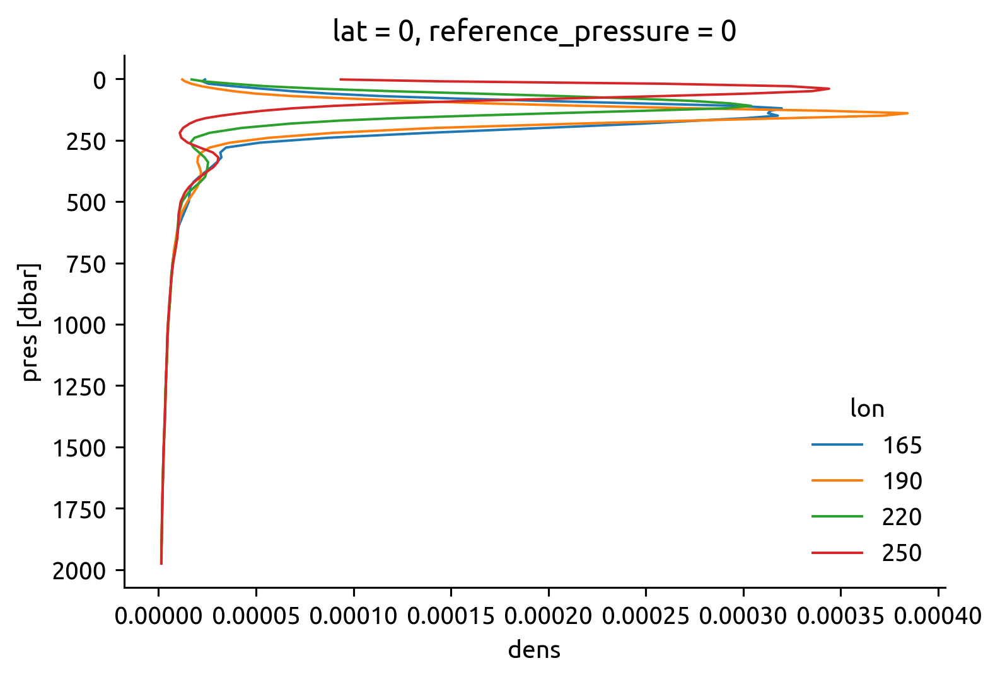

In [ ]:
N2.mean("time").cf.plot(hue="lon", y="Z", yincrease=False)

## Sampling: how is tao resolving MI at 140W during MAM

In [ ]:
tao = pump.obs.read_tao_zarr("ancillary")

In [ ]:
from dask.distributed import Client

client = Client("tcp://127.0.0.1:44303")
client

Client Scheduler: tcp://127.0.0.1:44303 Dashboard: http://127.0.0.1:8787/status,Cluster Workers: 3 Cores: 6 Memory: 25.04 GB


In [ ]:
tao140 = tao.sel(longitude=-140).persist()

Looks like there's plenty of T data above the EUC max so no issues there? There's a decade where EUCmax is deeper than 75m or so...

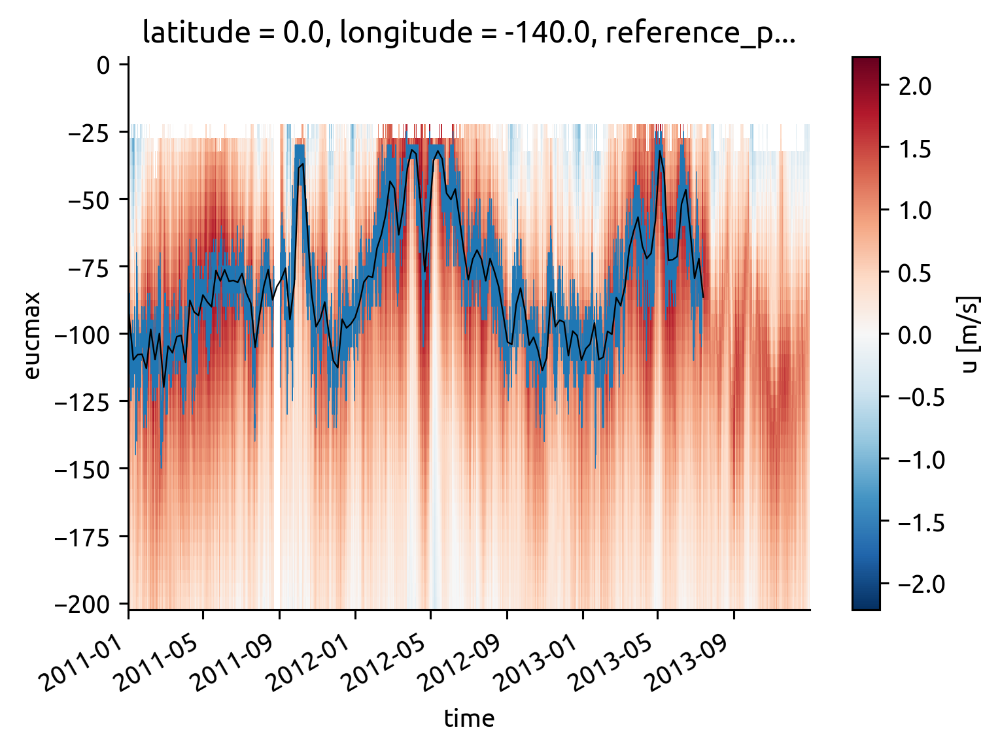

In [ ]:
tao140.u.sel(depth=slice(-200, None), time=slice("2011", "2013")).plot(x="time")
tao140.eucmax.plot(lw=0.3)
tao140.eucmax.resample(time="W").mean().plot(color='k', lw=0.6)

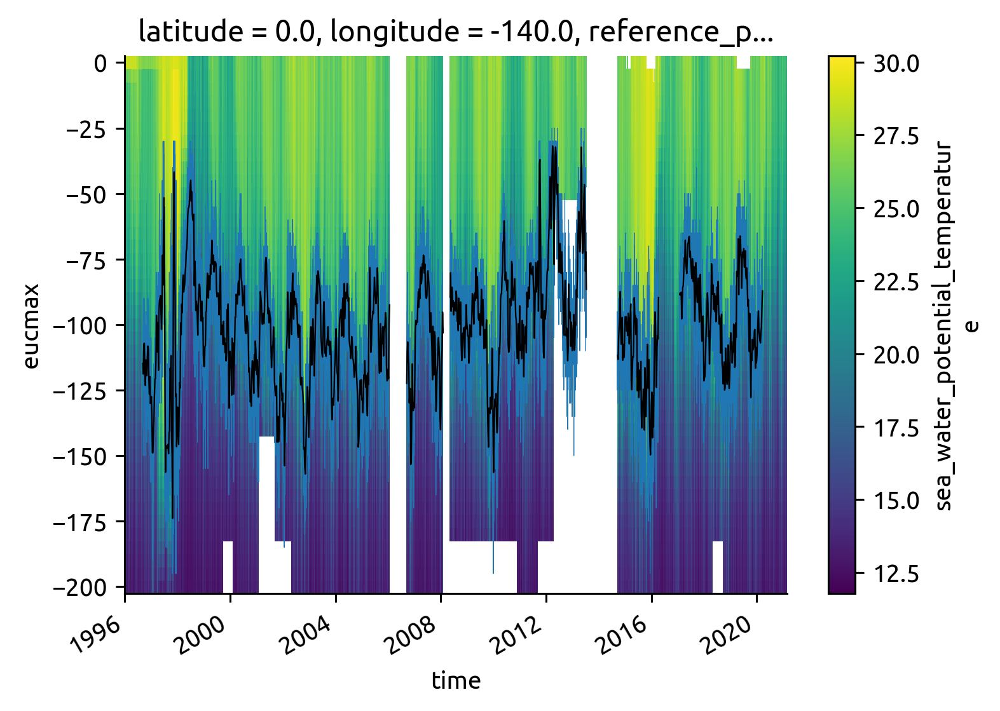

In [ ]:
tao140.T.sel(depth=slice(-200, None), time=slice("1996", None)).plot(x="time")
tao140.eucmax.plot(lw=0.3)
tao140.eucmax.resample(time="W").mean().plot(color='k', lw=0.6)

In [ ]:
tao140.eucmax.to_netcdf("eucmax-140.nc")

## calculate Rig

/gpfs/u/home/dcherian/python/xarray/xarray/core/common.py:664: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, the dimension order of these coordinates will be restored as well unless you specify restore_coord_dims=False.
  self, group, squeeze=squeeze, restore_coord_dims=restore_coord_dims


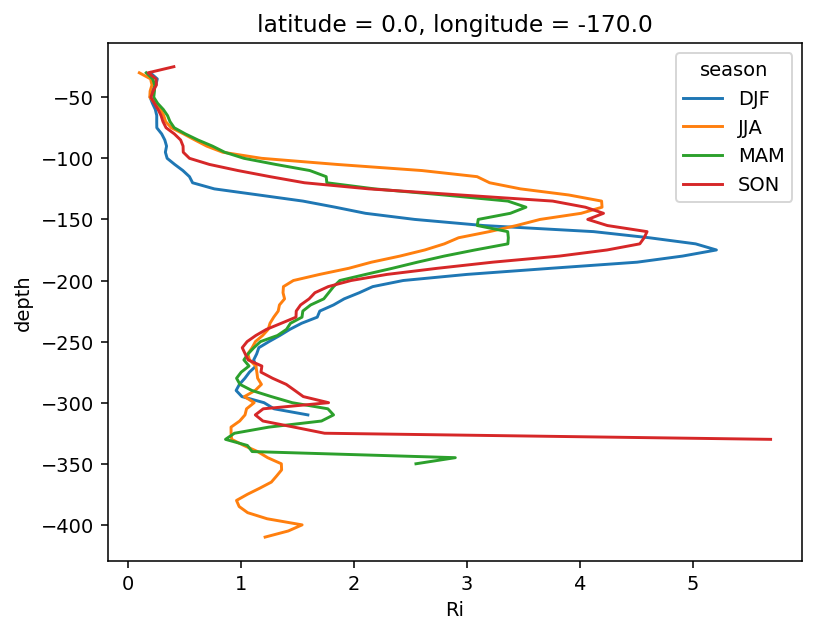

In [ ]:
sub = tao.Rig.isel(longitude=2).compute().groupby("time.season").median("time")
sub.plot(hue="season", y="depth",)

In [ ]:
median_Rig_z = tao.Rig.groupby("time.season").apply(
    lambda x: x.chunk({"time": -1}).quantile(q=0.5, dim="time")
)
median_Rig_z.load()

<xarray.DataArray 'Rig' (season: 4, longitude: 5, depth: 101)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]])
Coordinates:
    quantile   float64 0.5
  * longitude  (longitude) float64 -204.0 -195.0 -170.0 -140.0 -110.0
  * depth      (depth) float64 -500.0 -495.0 -490.0 -485.0 ... -10.0 -5.0 0.0
  * season     (season) object 'DJF' 'JJA' 'MAM' 'SON'
Attributes:
    long_name:  Ri

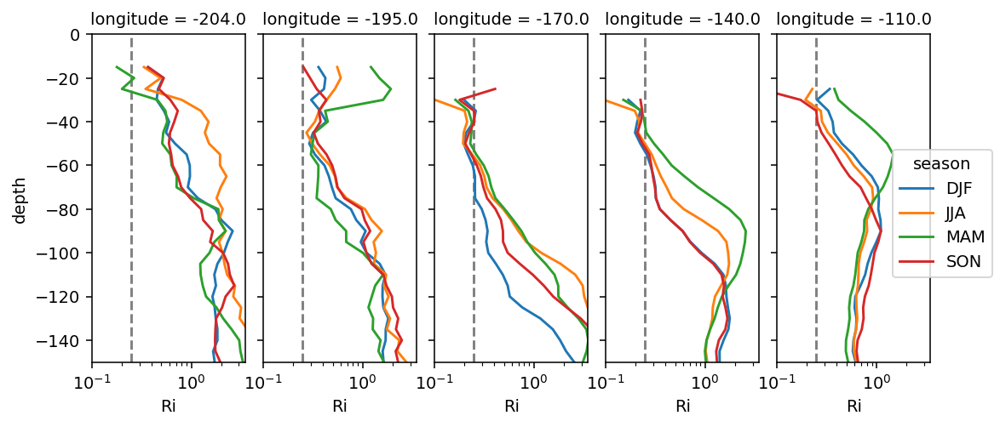

In [ ]:
fg = median_Rig_z.squeeze().plot.line(
    col="longitude",
    hue="season",
    y="depth",
    ylim=[-150, 0],
    xlim=[0.1, 3.5],
    xscale="log",
)
fg.map(lambda: dcpy.plots.linex([0.25]))
plt.gcf().set_size_inches((8, 4))

## bin in euc-relative coordinates

In [ ]:
tao = pump.obs.read_tao_zarr("ancillary")
interped = xr.open_zarr("tao-zeuc.zarr")
tao

<xarray.Dataset>
Dimensions:             (depth: 61, longitude: 5, time: 287335)
Coordinates:
    deepest             (time, longitude) float64 dask.array<chunksize=(100000, 1), meta=np.ndarray>
  * depth               (depth) float64 -300.0 -295.0 -290.0 ... -10.0 -5.0 0.0
    eucmax              (time, longitude) float64 dask.array<chunksize=(287335, 4), meta=np.ndarray>
    latitude            float32 ...
  * longitude           (longitude) float64 -204.0 -195.0 -170.0 -140.0 -110.0
    mld                 (time, longitude) float64 dask.array<chunksize=(100000, 1), meta=np.ndarray>
    reference_pressure  int64 ...
    shallowest          (time, longitude) float64 dask.array<chunksize=(100000, 1), meta=np.ndarray>
  * time                (time) datetime64[ns] 1988-05-15T18:00:00 ... 2021-02-24
    zeuc                (depth, time, longitude) float64 dask.array<chunksize=(61, 287335, 4), meta=np.ndarray>
Data variables:
    N2                  (time, longitude, depth) float64 dask.array<chunksize=(100000, 1, 61), meta=np.ndarray>
    N2T                 (time, longitude, depth) float64 dask.array<chunksize=(100000, 1, 61), meta=np.ndarray>
    Ri                  (time, longitude, depth) float64 dask.array<chunksize=(100000, 1, 61), meta=np.ndarray>
    Rig_T               (time, longitude, depth) float64 dask.array<chunksize=(100000, 1, 61), meta=np.ndarray>
    S                   (time, longitude, depth) float64 dask.array<chunksize=(100000, 1, 61), meta=np.ndarray>
    S2                  (time, depth, longitude) float32 dask.array<chunksize=(100000, 61, 1), meta=np.ndarray>
    T                   (time, longitude, depth) float64 dask.array<chunksize=(100000, 1, 61), meta=np.ndarray>
    dens                (time, longitude, depth) float64 dask.array<chunksize=(100000, 1, 61), meta=np.ndarray>
    densT               (time, longitude, depth) float64 dask.array<chunksize=(100000, 1, 61), meta=np.ndarray>
    u                   (time, depth, longitude) float32 dask.array<chunksize=(100000, 61, 1), meta=np.ndarray>
    v                   (time, depth, longitude) float32 dask.array<chunksize=(100000, 61, 1), meta=np.ndarray>

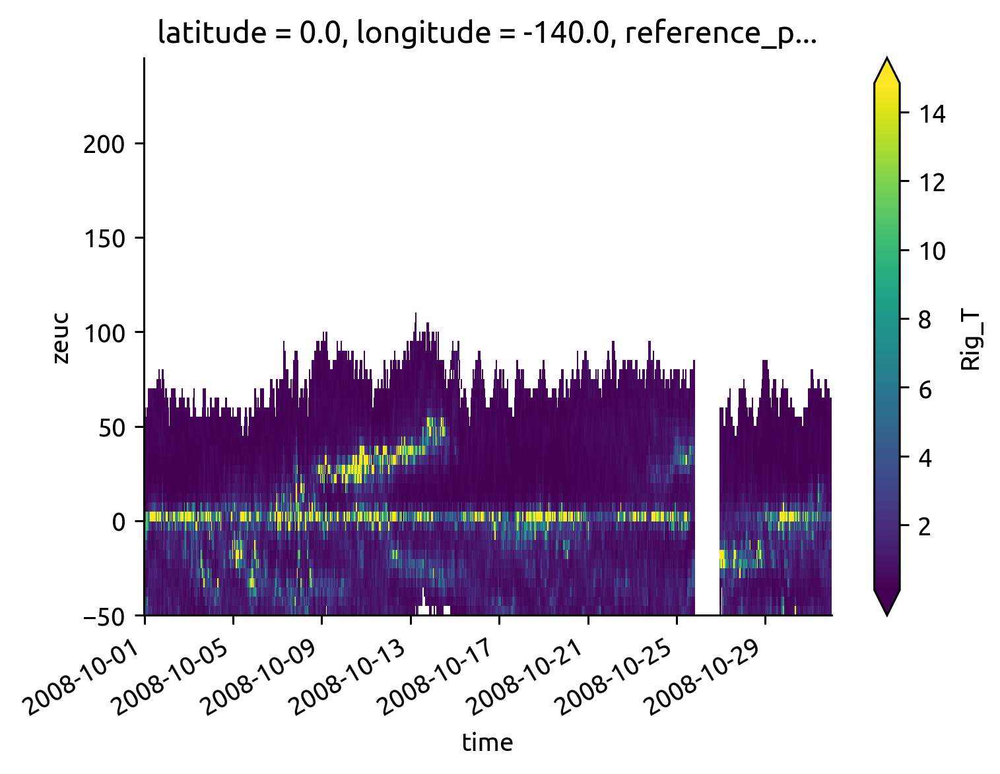

In [ ]:
interped.Rig_T.sel(longitude=-140, time="2008-10").plot(x="time", robust=True)

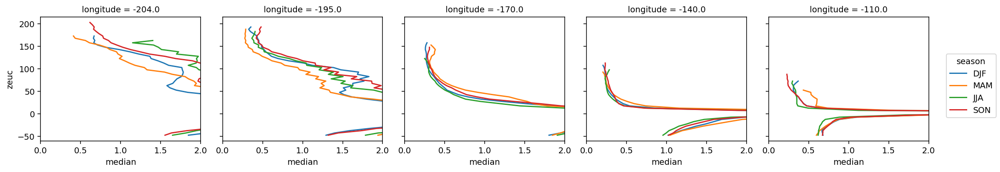

In [ ]:
seasonal["median"].where(seasonal["count"] > 60*24).plot.line(
    hue="season", y="zeuc", col="longitude", xlim=(0, 2))

/glade/u/home/dcherian/miniconda3/envs/dcpy/lib/python3.6/site-packages/matplotlib/colors.py:1110: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


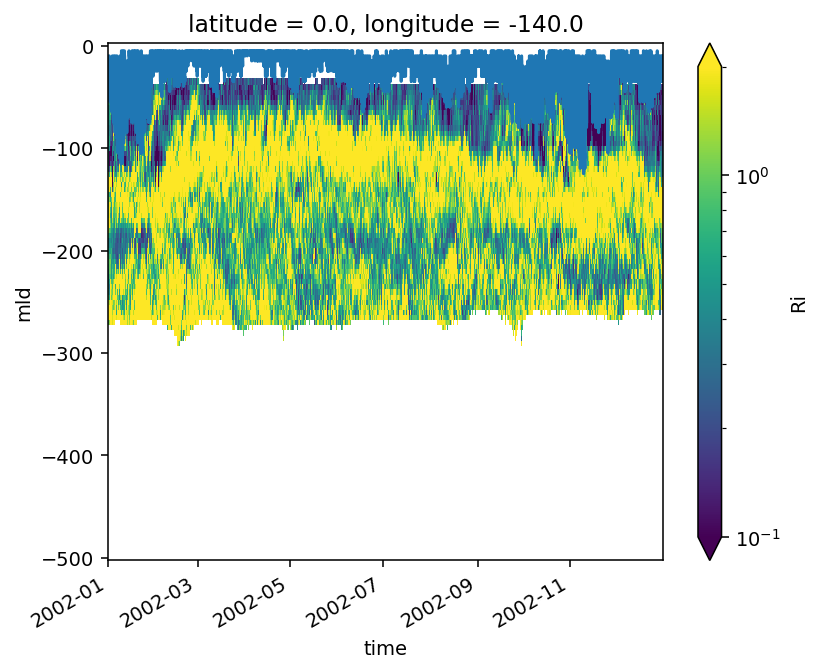

In [ ]:
subset = good_data.sel(longitude=-140, time="2002")
subset.Rig.plot(x="time", robust=True, vmin=0.1, vmax=2, norm=mpl.colors.LogNorm())
subset.mld.plot(x="time")

## Gradient Ri quantiles

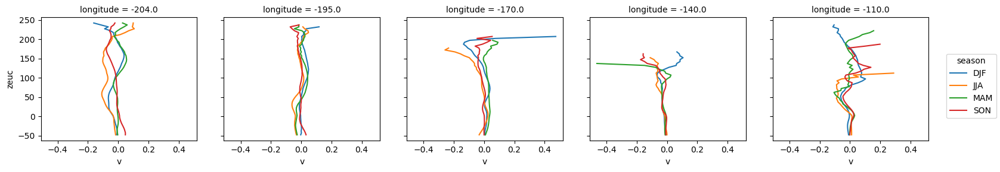

In [ ]:
grouped = interped.groupby("time.season")
seasonal = grouped.mean().compute()

seasonal.v.plot(y="zeuc", col="longitude", hue="season")

/gpfs/u/home/dcherian/python/xarray/xarray/plot/plot.py:107: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  xplt = darray.transpose(ydim, huedim)


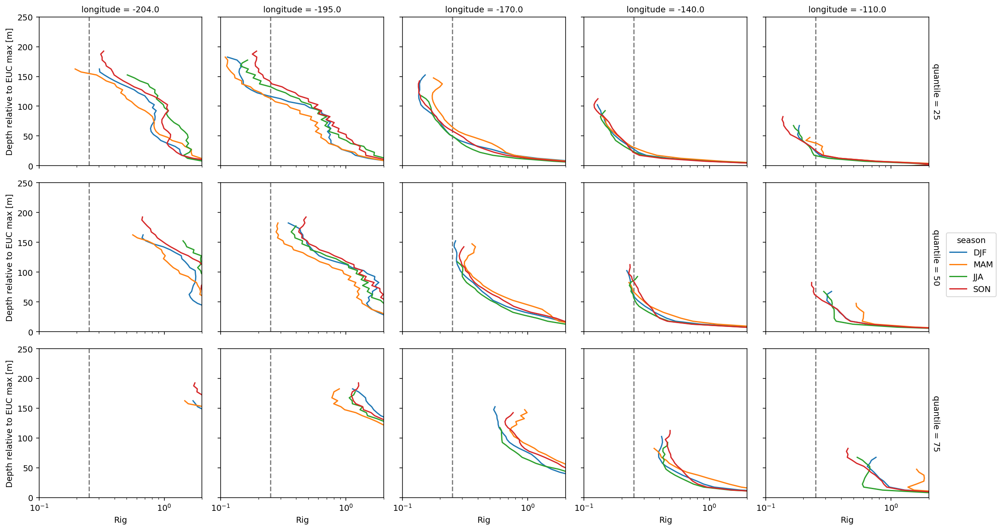

In [ ]:
%matplotlib inline

fg = Ri_q.where(Ri_q.num_obs > 90 * 24).plot.line(
    row="quantile", 
    col="longitude", 
    hue="season", 
    y="zeuc", 
    xlim=[1e-1, 2], 
    ylim=[0, 250], 
    xscale="log")

fg.map(lambda: dcpy.plots.linex(0.25, ax=plt.gca()))

/gpfs/u/home/dcherian/python/xarray/xarray/plot/plot.py:107: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  xplt = darray.transpose(ydim, huedim)
findfont: Font family ['STIXGeneral'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXGeneral'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXGeneral'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXNonUnicode'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXNonUnicode'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXNonUnicode'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXSizeOneSym'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXSizeTwoSym'] not found. Falling back to DejaVu Sans.
findfont: Font family ['STIXSizeThreeSym'] not found. Falling back to DejaVu Sans.
find

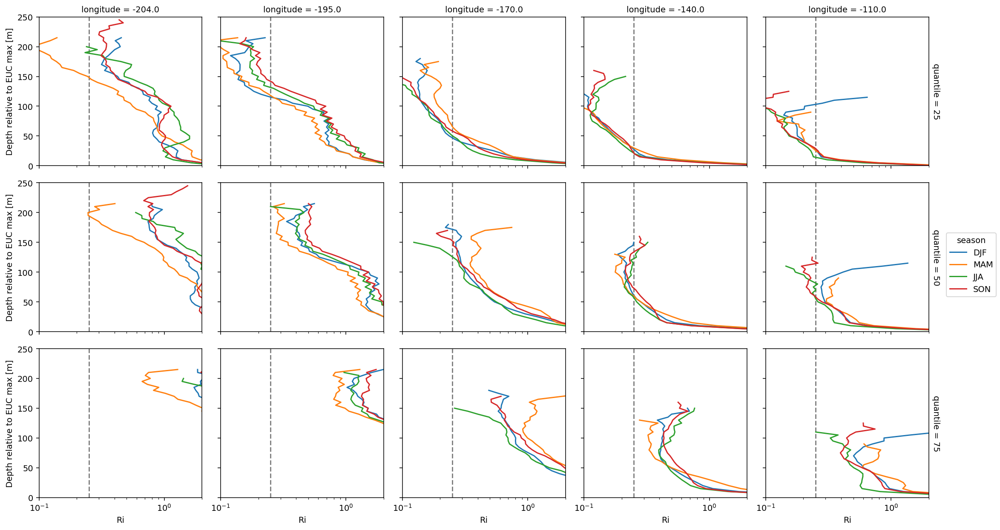

In [ ]:
%matplotlib inline

fg = Ri_q.where(Ri_q.num_obs > 90).plot.line(
    row="quantile", 
    col="longitude", 
    hue="season", 
    y="zeuc", 
    xlim=[1e-1, 2], 
    ylim=[0, 250], 
    xscale="log")

fg.map(lambda: dcpy.plots.linex(0.25, ax=plt.gca()))

#fg.fig.suptitle("25,50,75 percentile gradient Ri from all available hourly TAO data.", y=1.0)
#fg.fig.savefig("images/tao-marginal-stability-hourly-euc-coordinates.png", dpi=200)

## Median in euc-relative coordinate

In [ ]:
Ri_q = xr.load_dataarray("tao-hourly-Ri-seasonal-percentiles.nc")
Ri_q

<xarray.DataArray (season: 4, longitude: 5, zeuc: 59, quantile: 3)>
array([[[[8.65716985e-01, 1.84699736e+00, 4.07929186e+00],
         [9.68607747e-01, 2.07586669e+00, 4.69831821e+00],
         [1.12714689e+00, 2.45510051e+00, 5.63565819e+00],
         ...,
         [8.25933339e-01, 1.21812980e+00, 2.22266901e+00],
         [3.31773526e-02, 2.15271859e-01, 6.91555336e-01],
         [6.30251313e-01, 9.59637420e-01, 1.28902353e+00]],

        [[6.99998537e-01, 1.29253461e+00, 2.86526357e+00],
         [7.26263211e-01, 1.40190939e+00, 3.03401490e+00],
         [8.14764327e-01, 1.58527315e+00, 3.47211588e+00],
         ...,
         [           nan,            nan,            nan],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]],

        [[1.04342082e+00, 1.80473934e+00, 3.48219512e+00],
         [1.10594958e+00, 1.94826060e+00, 3.84621979e+00],
         [1.18464712e+00, 2.10952571e+00, 4.29768611e+00],
         ...,
         [           nan,            nan,            nan],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]],

        [[5.99332633e-01, 1.01832679e+00, 2.02945611e+00],
         [6.36358415e-01, 1.09730253e+00, 2.22929311e+00],
         [6.69077456e-01, 1.17499171e+00, 2.47144998e+00],
         ...,
         [           nan,            nan,            nan],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]],

        [[3.93460173e-01, 6.78976245e-01, 1.35634816e+00],
         [3.96662435e-01, 6.72044675e-01, 1.30979069e+00],
         [3.89880826e-01, 6.65452753e-01, 1.31105090e+00],
         ...,
         [1.71923451e+00, 2.11843237e+00, 3.14030388e+00],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]]],


       [[[9.64841693e-01, 2.03641443e+00, 5.24673701e+00],
         [1.00937285e+00, 2.07883897e+00, 5.36984820e+00],
         [1.07954196e+00, 2.17156104e+00, 5.51939592e+00],
         ...,
         [9.45015072e-01, 1.23069288e+00, 3.89244182e+00],
         [3.19059242e-01, 4.46329690e-01, 1.42386922e+00],
         [           nan,            nan,            nan]],

        [[9.77766440e-01, 1.94110422e+00, 4.23775491e+00],
         [1.02809324e+00, 2.09342055e+00, 4.71047287e+00],
         [1.20866875e+00, 2.40437219e+00, 5.50768658e+00],
         ...,
         [           nan,            nan,            nan],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]],

        [[1.06829041e+00, 1.84754009e+00, 3.53931845e+00],
         [1.11732667e+00, 1.94676703e+00, 3.81204909e+00],
         [1.15610819e+00, 2.03169397e+00, 4.13639554e+00],
         ...,
         [           nan,            nan,            nan],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]],

        [[6.45954343e-01, 1.04209220e+00, 1.87051596e+00],
         [6.91774334e-01, 1.11851238e+00, 2.00851346e+00],
         [7.23639413e-01, 1.19311723e+00, 2.28014936e+00],
         ...,
         [           nan,            nan,            nan],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]],

        [[3.90188842e-01, 5.96989693e-01, 1.09097169e+00],
         [3.99915480e-01, 6.17991764e-01, 1.10944998e+00],
         [4.09988742e-01, 6.36251961e-01, 1.14362343e+00],
         ...,
         [           nan,            nan,            nan],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]]],


       [[[8.05875978e-01, 1.64882518e+00, 3.74725616e+00],
         [8.49498749e-01, 1.81732453e+00, 4.24185284e+00],
         [9.22981317e-01, 1.94493706e+00, 4.58776057e+00],
         ...,
         [3.77534561e-01, 5.81013898e

In [ ]:
median_Rig = Ri_q.sel(quantile=0.5, zeuc=slice(0, None))
median_Rig

<xarray.DataArray (season: 4, longitude: 5, zeuc: 49)>
array([[[1.21434122e+01, 5.20354724e+00, 3.50501919e+00, 3.30736311e+00,
         3.33031631e+00, 3.43964060e+00, 2.92148757e+00, 2.48129720e+00,
         2.11243240e+00, 1.83912229e+00, 1.69382899e+00, 1.61765319e+00,
         1.57829252e+00, 1.65197799e+00, 1.67660646e+00, 1.70361004e+00,
         1.75811871e+00, 1.77633452e+00, 1.78274006e+00, 1.77130445e+00,
         1.76453557e+00, 1.59982041e+00, 1.53944503e+00, 1.46579473e+00,
         1.38052897e+00, 1.36555182e+00, 1.22801891e+00, 1.11480848e+00,
         9.81393217e-01, 8.09430894e-01, 7.11033315e-01, 6.64250979e-01,
         6.77348794e-01, 6.59767973e-01, 6.68314872e-01, 6.45685835e-01,
         6.25755328e-01, 6.47728194e-01, 6.16354965e-01, 7.43610355e-01,
         7.47971748e-01, 7.51553840e-01, 6.64788050e-01, 6.37038637e-01,
         7.09365153e-01, 1.08899569e+00, 1.21812980e+00, 2.15271859e-01,
         9.59637420e-01],
        [1.13882227e+01, 4.77078332e+00, 3.17914688e+00, 2.61438944e+00,
         2.32290267e+00, 2.03380830e+00, 1.79832267e+00, 1.61383103e+00,
         1.51623494e+00, 1.46151757e+00, 1.53912420e+00, 1.50846894e+00,
         1.62729495e+00, 1.62687128e+00, 1.76641538e+00, 1.71702053e+00,
         1.82824524e+00, 1.68400249e+00, 1.69879042e+00, 1.47777091e+00,
         1.38645753e+00, 1.11946488e+00, 1.01298141e+00, 8.26534889e-01,
         6.92515550e-01, 6.09600706e-01, 5.75299815e-01, 5.40169666e-01,
         5.15796523e-01, 4.88624275e-01, 4.84976674e-01, 4.53798638e-01,
         4.52561612e-01, 4.34450104e-01, 4.29997400e-01, 3.87855213e-01,
         3.46594639e-01, 3.25506862e-01, 3.52597288e-01, 3.80018426e-01,
         3.84656549e-01, 4.43017123e-01, 4.07717999e-01, 5.74185724e-01,
         9.16682658e-01, 4.36350802e-01,            nan,            nan,
                    nan],
        [1.47684744e+01, 5.04312084e+00, 2.56775010e+00, 1.85025533e+00,
         1.51538755e+00, 1.21760241e+00, 9.54120770e-01, 7.90525610e-01,
         6.72324136e-01, 5.98292186e-01, 5.29106407e-01, 4.99256817e-01,
         4.65811035e-01, 4.33383038e-01, 4.10126868e-01, 3.87110152e-01,
         3.66788709e-01, 3.40755814e-01, 3.19803196e-01, 3.02440042e-01,
         2.89701995e-01, 2.82765766e-01, 2.75048658e-01, 2.70829288e-01,
         2.70248861e-01, 2.72051211e-01, 2.72058429e-01, 2.67041272e-01,
         2.58904990e-01, 2.60149478e-01, 2.65921342e-01, 2.79376712e-01,
         2.90498832e-01, 2.87567105e-01, 2.71350610e-01, 2.39308328e-01,
         2.84417943e-01, 2.52591608e-01, 2.24577574e-01, 1.48891455e-01,
                    nan,            nan,            nan,            nan,
                    nan,            nan,            nan,            nan,
                    nan],
        [8.36970312e+00, 2.14714176e+00, 8.60081631e-01, 5.37678636e-01,
         4.56452975e-01, 4.08223936e-01, 3.65848689e-01, 3.36680169e-01,
         3.07557415e-01, 2.86030920e-01, 2.67174971e-01, 2.53727388e-01,
         2.47924187e-01, 2.42138913e-01, 2.37619971e-01, 2.32915351e-01,
         2.35271202e-01, 2.33308752e-01, 2.29976608e-01, 2.25829450e-01,
         2.19308704e-01, 2.04431004e-01, 2.03778743e-01, 1.90089052e-01,
         1.91867722e-01, 2.53620813e-01, 2.88059360e-01, 3.41855224e-01,
         3.33964955e-01, 2.12386931e-01, 1.75787371e-01, 1.36908322e-01,
                    nan,            nan,            nan,            nan,
                    nan,            nan,            nan,            nan,
                    nan,            nan,            nan,            nan,
                    nan,            nan,            nan,            nan,
                    nan],
        [6.06131842e+00, 1.47315757e+00, 6.69238501e-01, 4.78770333e-01,
         4.38250354e-01, 4.14118137e-01, 3.88180626e-01, 3.71394866e-01,
         3.42725616e-01, 3.24029195e-01, 3.07485755e-01, 3.10154128e-01,
         3.08549184e-01, 3.35307815e-01, 3.69083744e-01, 4.11380242e-01,
         5.76389174e-01, 6.93941870e-01, 6.69

<IPython.core.display.Javascript object>


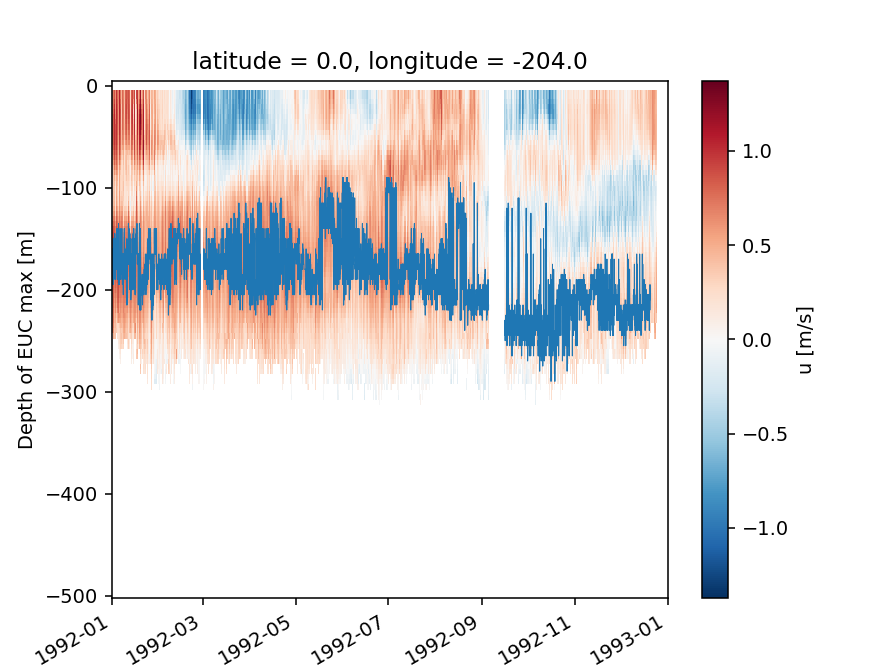

In [ ]:
%matplotlib notebook

tao.u.isel(longitude=0).sel(time=slice("1992", "1993")).plot(x="time")
tao.eucmax.isel(longitude=0).sel(time=slice("1992", "1993")).plot(
    x="time", lw=0.5, xlim=["1992", "1993"]
)

### after binning instead of reinterpolating to euc depth coordinate

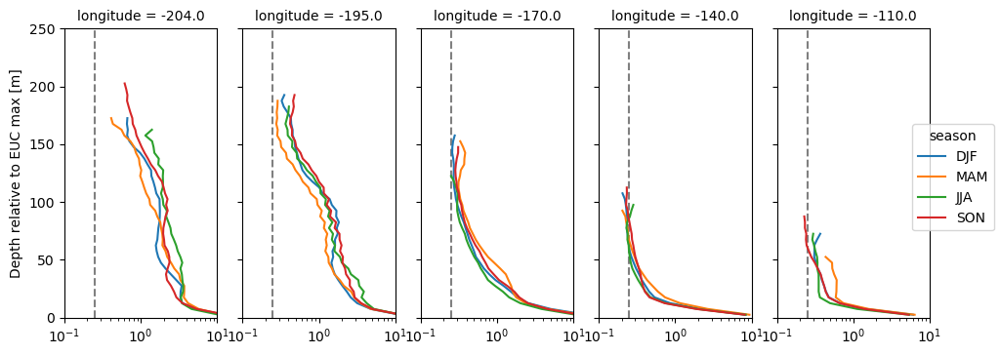

In [ ]:
fg = median_Rig.where(median_Rig.num_obs > 60*24).plot.line(    
    col="longitude", 
    hue="season", 
    y="zeuc", 
    xlim=[1e-1, 10], 
    ylim=[0, 250], 
    xscale="log")

fg.map(lambda: dcpy.plots.linex(0.25, ax=plt.gca()))
fg.fig.set_size_inches((10, 4))

### after gridding T,u to same grid

some minor differences especially at 110W

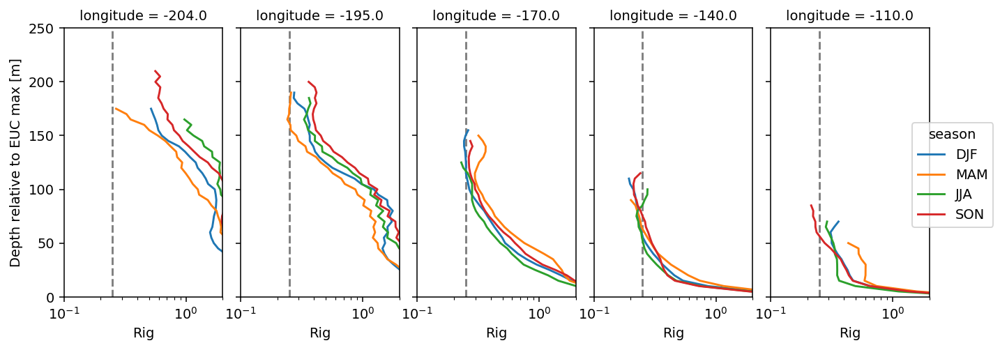

In [ ]:
%matplotlib inline

fg = Ri_q.where(Ri_q.num_obs > 60*24).sel(quantile=50).plot.line( 
    col="longitude", 
    hue="season", 
    y="zeuc", 
    xlim=[1e-1, 2], 
    ylim=[0, 250], 
    xscale="log")

fg.map(lambda: dcpy.plots.linex(0.25, ax=plt.gca()))
fg.fig.set_size_inches((10, 4))


### after filling NaNs with pchip
and properly filtering eucmax

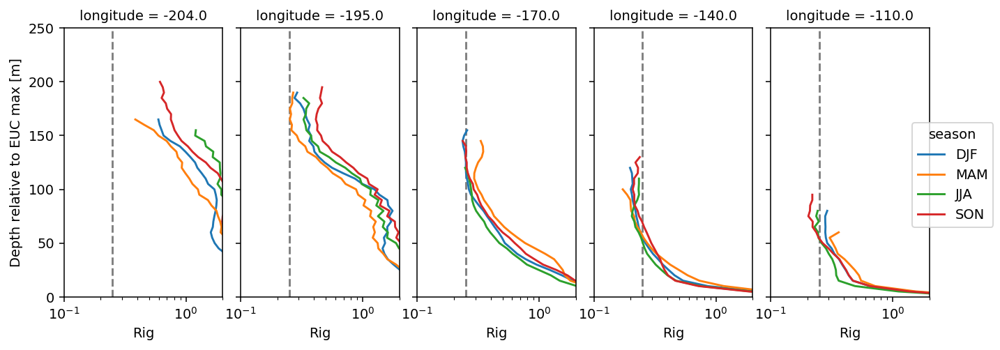

In [ ]:
fg = Ri_q.where(Ri_q.num_obs > 90*24).sel(quantile=50).plot.line( 
    col="longitude", 
    hue="season", 
    y="zeuc", 
    xlim=[1e-1, 2], 
    ylim=[0, 250], 
    xscale="log")

fg.map(lambda: dcpy.plots.linex(0.25, ax=plt.gca()))
fg.fig.set_size_inches((10, 4))

fg.fig.savefig("images/tao-marginal-stability-zeuc-Rig-median.png", dpi=200)

### before filling NaNs with pchip

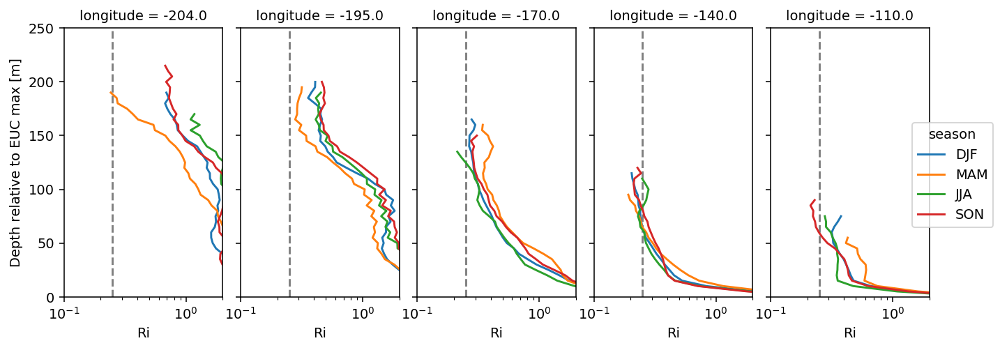

In [ ]:
fg = Ri_q.where(Ri_q.num_obs > 30*24).sel(quantile=50).plot.line( 
    col="longitude", 
    hue="season", 
    y="zeuc", 
    xlim=[1e-1, 2], 
    ylim=[0, 250], 
    xscale="log")

fg.map(lambda: dcpy.plots.linex(0.25, ax=plt.gca()))
fg.fig.set_size_inches((10, 4))

fg.fig.savefig("images/tao-marginal-stability-zeuc-Rig-median.png", dpi=200)

# Ri_q.Ri.sel(quantile=50).plot(xscale="log", xlim=[0.1, 2], y="zeuc", hue="season", col="longitude", ylim=[0, 250])

### Using number of observations > 90

This seems to work best.

There is an error here. Need 90*24

[None, None, None, None, None]

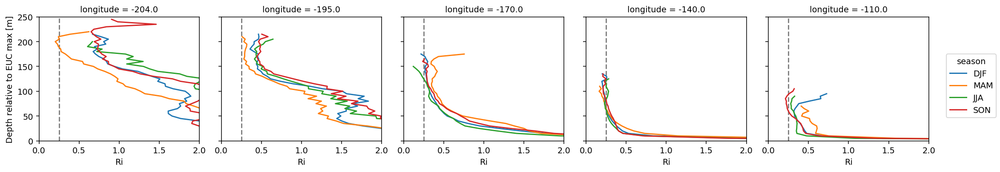

In [ ]:
fg = Ri_q.sel(quantile=50).where(Ri_q.num_obs > 90).plot.line(
    col="longitude", hue="season", y="zeuc", xlim=[0, 2], ylim=[0, 250]
)
[dcpy.plots.linex(0.25, ax=ax) for ax in fg.axes.flat]

### after removing mld

[None, None, None, None, None]

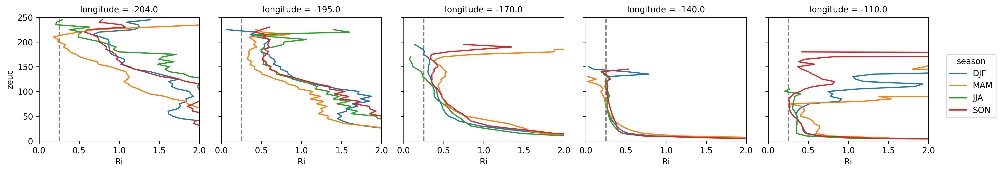

In [ ]:
fg = Ri_q.sel(quantile=50).plot.line(
    col="longitude", hue="season", y="zeuc", xlim=[0, 2], ylim=[0, 250]
)
[dcpy.plots.linex(0.25, ax=ax) for ax in fg.axes.flat]

### before removing mld

[None, None, None, None, None]

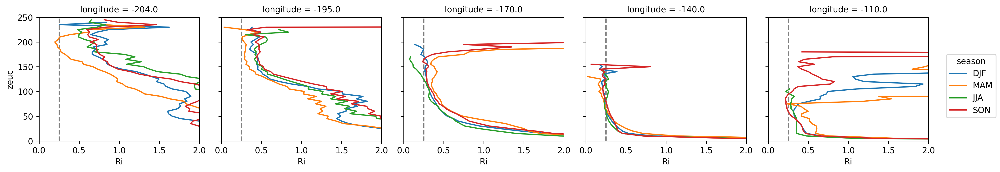

In [ ]:
fg = Ri_q.sel(quantile=50).isel(zeuc=slice(None,None,2)).plot.line(col="longitude", hue="season", y="zeuc", xlim=[0, 2], ylim=[0, 250])
[dcpy.plots.linex(0.25, ax=ax) for ax in fg.axes.flat]

### Before limiting eucmax to be deeper than 20m

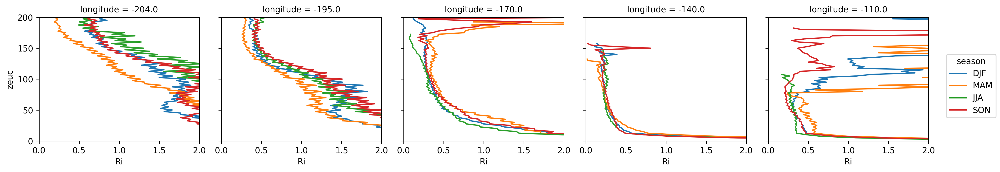

In [ ]:
Ri_q.sel(quantile=50).plot.line(col="longitude", hue="season", y="zeuc", xlim=[0, 2], ylim=[0, 200])

In [ ]:
Ri_q = (Ri.chunk({"time": -1, "depth": 25})
        .groupby("time.season")
        .apply(dask_quantile, dim="time", q=[25, 50, 75])).reindex(season=["DJF", "MAM", "JJA", "SON"])
Ri_q

<xarray.DataArray 'Ri' (season: 4, depth: 135, longitude: 5, quantile: 3)>
dask.array<getitem, shape=(4, 135, 5, 3), dtype=float64, chunksize=(1, 25, 1, 3), chunktype=numpy.ndarray>
Coordinates:
  * season     (season) object 'DJF' 'MAM' 'JJA' 'SON'
    latitude   float32 0.0
  * quantile   (quantile) int64 25 50 75
  * depth      (depth) float32 -750.0 -500.0 -495.0 -490.0 ... -3.0 -1.0 -0.0
  * longitude  (longitude) float32 -204.0 -195.0 -170.0 -140.0 -110.0

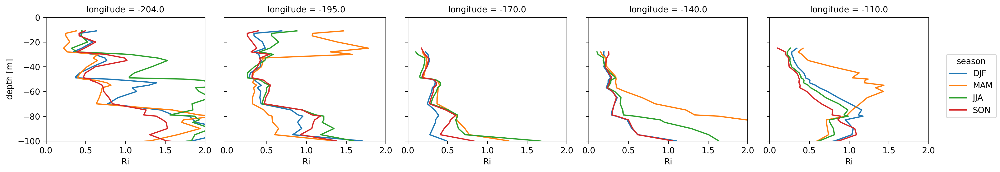

In [ ]:
Ri_q.sel(quantile=50).plot.line(y="depth", hue="season", col="longitude", xlim=[0, 2], ylim=[-100, 0])

In [ ]:
Ri.Ri.groupby("time.season").quantile([25, 50, 75])

In [ ]:
Ri.Ri.groupby("time.season").quantile

In [ ]:
median = Ri.Ri.groupby("time.season").apply(lambda x: dask_median(x, "time"))

<xarray.DataArray 'Ri' (season: 4, depth: 135, longitude: 5)>
dask.array<concatenate, shape=(4, 135, 5), dtype=float64, chunksize=(1, 10, 1), chunktype=numpy.ndarray>
Coordinates:
    latitude   float32 0.0
  * depth      (depth) float32 -750.0 -500.0 -495.0 -490.0 ... -3.0 -1.0 -0.0
  * longitude  (longitude) float64 -204.0 -195.0 -170.0 -140.0 -110.0
  * season     (season) object 'DJF' 'JJA' 'MAM' 'SON'

In [ ]:
seasonal = Ri.groupby('time.season')

for season, Ris in seasonal:
    Rigrouped = Ris.Ri.groupby_bins(Ris.zeuc, np.arange(0, 200, 10))
    for bin, group in Rigrouped:
        print(bin)

seasonal = (Ri
            .groupby('time.season').apply(lambda x: dask_median(x, "time"))
            .reindex(season=['DJF', 'MAM', 'JJA', 'SON']))

fg = (seasonal.plot.line(col='longitude', hue='season', y='depth',
                         ylim=[-150, 0], xlim=[0.1, 3.5], xscale='log'))
fg.map(lambda: dcpy.plots.linex([0.25, 0.3]))
plt.gcf().suptitle('Seasonal median 5m Ri | Hourly mean TAO ADCP, T '
                   , y=1.02)
plt.gcf().set_size_inches((8, 4))
plt.gcf().set_dpi(200)
# f, ax = plt.subplots(1, 1, constrained_layout=True)
# f.savefig('images/tao-marginal-stability-hourly.png')

KeyboardInterrupt: 

## How good is bulk Ri vs gradient Ri

In [ ]:
# del tao.time.encoding["_FillValue"]
tao.to_zarr("tao-gridded-ancillary.zarr", mode="w", consolidated=True)

In [ ]:
tao = pump.obs.read_tao_zarr("gridded")
tao

<xarray.Dataset>
Dimensions:    (depth: 101, longitude: 5, time: 292267)
Coordinates:
    deepest    (time, longitude) float64 dask.array<chunksize=(10000, 1), meta=np.ndarray>
  * depth      (depth) float64 -500.0 -495.0 -490.0 -485.0 ... -10.0 -5.0 0.0
    eucmax     (time, longitude) float64 dask.array<chunksize=(10000, 2), meta=np.ndarray>
    latitude   float32 ...
  * longitude  (longitude) float32 -204.0 -195.0 -170.0 -140.0 -110.0
    mld        (time, longitude) float64 dask.array<chunksize=(10000, 1), meta=np.ndarray>
  * time       (time) datetime64[ns] 1985-10-01T06:00:00 ... 2019-02-03
    zeuc       (depth, time, longitude) float64 dask.array<chunksize=(101, 10000, 1), meta=np.ndarray>
Data variables:
    Rig        (time, longitude, depth) float64 dask.array<chunksize=(10000, 1, 101), meta=np.ndarray>
    T          (time, longitude, depth) float64 dask.array<chunksize=(10000, 1, 101), meta=np.ndarray>
    dens       (time, longitude, depth) float64 dask.array<chunksize=(10000, 1, 101), meta=np.ndarray>
    u          (time, depth, longitude) float32 dask.array<chunksize=(10000, 101, 1), meta=np.ndarray>
    v          (time, depth, longitude) float32 dask.array<chunksize=(10000, 101, 1), meta=np.ndarray>

In [ ]:
tao_zeuc = xr.open_zarr("tao-zeuc.zarr", consolidated=True)
tao_zeuc

<xarray.Dataset>
Dimensions:    (longitude: 5, time: 292267, zeuc: 59)
Coordinates:
    deepest    (time, longitude) float64 dask.array<chunksize=(10000, 1), meta=np.ndarray>
    eucmax     (time, longitude) float64 dask.array<chunksize=(292267, 5), meta=np.ndarray>
    latitude   float32 ...
  * longitude  (longitude) float32 -204.0 -195.0 -170.0 -140.0 -110.0
    mld        (time, longitude) float64 dask.array<chunksize=(10000, 1), meta=np.ndarray>
  * time       (time) datetime64[ns] 1985-10-01T06:00:00 ... 2019-02-03
  * zeuc       (zeuc) float64 -47.5 -42.5 -37.5 -32.5 ... 232.5 237.5 242.5
Data variables:
    Rig        (time, longitude, zeuc) float64 dask.array<chunksize=(10000, 1, 59), meta=np.ndarray>
    T          (time, longitude, zeuc) float64 dask.array<chunksize=(10000, 1, 59), meta=np.ndarray>
    dens       (time, longitude, zeuc) float64 dask.array<chunksize=(10000, 1, 59), meta=np.ndarray>
    u          (time, longitude, zeuc) float64 dask.array<chunksize=(10000, 1, 59), meta=np.ndarray>
    v          (time, longitude, zeuc) float64 dask.array<chunksize=(10000, 1, 59), meta=np.ndarray>

In [ ]:
tao_clim["Rig"] = pump.calc.calc_tao_ri(
    tao_clim[["u", "v"]].expand_dims(time=1), 
    tao_clim["T"].expand_dims(time=1)
)

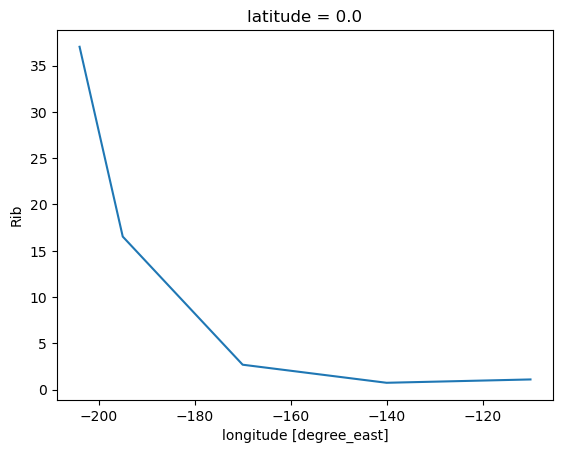

In [ ]:
tao_clim.Rib.plot(x="longitude")
# tao_clim.Rig.plot(x="longitude")

In [ ]:
interped.sel(zeuc=slice(0,None)).quantile(dim="zeuc", q=0.5).count("time").compute()

<xarray.DataArray (longitude: 5)>
array([ 21840, 107780, 102208, 136161,  97035])
Coordinates:
  * longitude  (longitude) float64 -204.0 -195.0 -170.0 -140.0 -110.0
    quantile   float64 0.5

In [ ]:
Ri_q = xr.load_dataarray("tao-hourly-Ri-seasonal-percentiles.nc")
Ri_q

<xarray.DataArray 'Rig' (season: 4, longitude: 5, zeuc: 59, quantile: 3)>
array([[[[8.65716985e-01, 1.84699736e+00, 4.07929186e+00],
         [9.68607747e-01, 2.07586669e+00, 4.69831821e+00],
         [1.12714689e+00, 2.45510051e+00, 5.63565819e+00],
         ...,
         [8.25933339e-01, 1.21812980e+00, 2.22266901e+00],
         [3.31773526e-02, 2.15271859e-01, 6.91555336e-01],
         [6.30251313e-01, 9.59637420e-01, 1.28902353e+00]],

        [[6.99998537e-01, 1.29253461e+00, 2.86526357e+00],
         [7.26263211e-01, 1.40190939e+00, 3.03401490e+00],
         [8.14764327e-01, 1.58527315e+00, 3.47211588e+00],
         ...,
         [           nan,            nan,            nan],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]],

        [[1.04342082e+00, 1.80473934e+00, 3.48219512e+00],
         [1.10594958e+00, 1.94826060e+00, 3.84621979e+00],
         [1.18464712e+00, 2.10952571e+00, 4.29768611e+00],
         ...,
         [           nan,            nan,            nan],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]],

        [[5.99332633e-01, 1.01832679e+00, 2.02945611e+00],
         [6.36358415e-01, 1.09730253e+00, 2.22929311e+00],
         [6.69077456e-01, 1.17499171e+00, 2.47144998e+00],
         ...,
         [           nan,            nan,            nan],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]],

        [[3.93460173e-01, 6.78976245e-01, 1.35634816e+00],
         [3.96662435e-01, 6.72044675e-01, 1.30979069e+00],
         [3.89880826e-01, 6.65452753e-01, 1.31105090e+00],
         ...,
         [1.71923451e+00, 2.11843237e+00, 3.14030388e+00],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]]],


       [[[9.64841693e-01, 2.03641443e+00, 5.24673701e+00],
         [1.00937285e+00, 2.07883897e+00, 5.36984820e+00],
         [1.07954196e+00, 2.17156104e+00, 5.51939592e+00],
         ...,
         [9.45015072e-01, 1.23069288e+00, 3.89244182e+00],
         [3.19059242e-01, 4.46329690e-01, 1.42386922e+00],
         [           nan,            nan,            nan]],

        [[9.77766440e-01, 1.94110422e+00, 4.23775491e+00],
         [1.02809324e+00, 2.09342055e+00, 4.71047287e+00],
         [1.20866875e+00, 2.40437219e+00, 5.50768658e+00],
         ...,
         [           nan,            nan,            nan],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]],

        [[1.06829041e+00, 1.84754009e+00, 3.53931845e+00],
         [1.11732667e+00, 1.94676703e+00, 3.81204909e+00],
         [1.15610819e+00, 2.03169397e+00, 4.13639554e+00],
         ...,
         [           nan,            nan,            nan],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]],

        [[6.45954343e-01, 1.04209220e+00, 1.87051596e+00],
         [6.91774334e-01, 1.11851238e+00, 2.00851346e+00],
         [7.23639413e-01, 1.19311723e+00, 2.28014936e+00],
         ...,
         [           nan,            nan,            nan],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]],

        [[3.90188842e-01, 5.96989693e-01, 1.09097169e+00],
         [3.99915480e-01, 6.17991764e-01, 1.10944998e+00],
         [4.09988742e-01, 6.36251961e-01, 1.14362343e+00],
         ...,
         [           nan,            nan,            nan],
         [           nan,            nan,            nan],
         [           nan,            nan,            nan]]],


       [[[8.05875978e-01, 1.64882518e+00, 3.74725616e+00],
         [8.49498749e-01, 1.81732453e+00, 4.24185284e+00],
         [9.22981317e-01, 1.94493706e+00, 4.58776057e+00],
         ...,
         [3.77534561e-01, 5.810

In [ ]:
median_Rig = interped.sel(zeuc=slice(0, None)).quantile(dim="zeuc", q=0.5)
median_Rig

<xarray.DataArray (time: 292267, longitude: 5)>
dask.array<getitem, shape=(292267, 5), dtype=float64, chunksize=(10000, 1), chunktype=numpy.ndarray>
Coordinates:
  * longitude  (longitude) float64 -204.0 -195.0 -170.0 -140.0 -110.0
  * time       (time) datetime64[ns] 1985-10-01T06:00:00 ... 2019-02-03
    eucmax     (time, longitude) float64 dask.array<chunksize=(292267, 5), meta=np.ndarray>
    mld        (time, longitude) float64 dask.array<chunksize=(10000, 1), meta=np.ndarray>
    deepest    (time, longitude) float64 dask.array<chunksize=(10000, 1), meta=np.ndarray>
    quantile   float64 0.5

quick fix. Take median of bulk Ri

In [ ]:
median_Rib = bulk_Ri.groupby("time.season").apply(lambda x: x.chunk({"time": -1}).quantile(q=0.5, dim="time")).compute()

/gpfs/u/home/dcherian/python/xarray/xarray/core/common.py:664: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, the dimension order of these coordinates will be restored as well unless you specify restore_coord_dims=False.
  self, group, squeeze=squeeze, restore_coord_dims=restore_coord_dims


In [ ]:
medians = xr.Dataset()
medians["Rib"] = median_Rib
medians["Rig"] = median_Rig.sel(zeuc=slice(0,None)).median("zeuc")

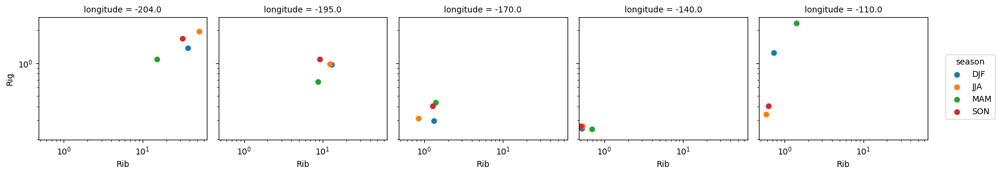

In [ ]:
fg = medians.plot.scatter(x="Rib", y="Rig", hue="season", col="longitude")
fg.axes[0,0].set_xscale("log")
fg.axes[0,0].set_yscale("log")

In [ ]:
tao_bulk = pump.calc.estimate_euc_depth_terms(
    tao, inplace=False
)
bulk_Ri = tao_bulk["Rib"]

Ri = xr.Dataset({"bulk": bulk_Ri, "gradient": median_Rig})
Ri["season"] = Ri.time.dt.season
Ri.load()

/gpfs/u/home/dcherian/python/xarray/xarray/core/missing.py:393: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  ).transpose(*arr.dims)
/gpfs/u/home/dcherian/python/xarray/xarray/core/missing.py:393: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  ).transpose(*arr.dims)


<xarray.Dataset>
Dimensions:    (longitude: 5, time: 292267)
Coordinates:
    latitude   float32 0.0
  * longitude  (longitude) float64 -204.0 -195.0 -170.0 -140.0 -110.0
  * time       (time) datetime64[ns] 1985-10-01T06:00:00 ... 2019-02-03
    eucmax     (time, longitude) float64 nan nan nan nan nan ... nan nan nan nan
    mld        (time, longitude) float64 nan nan nan nan ... -20.0 nan -5.0 -5.0
    deepest    (time, longitude) float64 nan nan nan nan ... nan -500.0 -500.0
    quantile   float64 0.5
Data variables:
    bulk       (time, longitude) float64 nan nan nan nan nan ... nan nan nan nan
    gradient   (time, longitude) float64 nan nan nan nan nan ... nan nan nan nan
    season     (time) <U3 'SON' 'SON' 'SON' 'SON' ... 'DJF' 'DJF' 'DJF' 'DJF'

In [ ]:
# Ri.time.encoding.pop("_FillValue")
Ri.to_netcdf("rib-median-rig.nc")

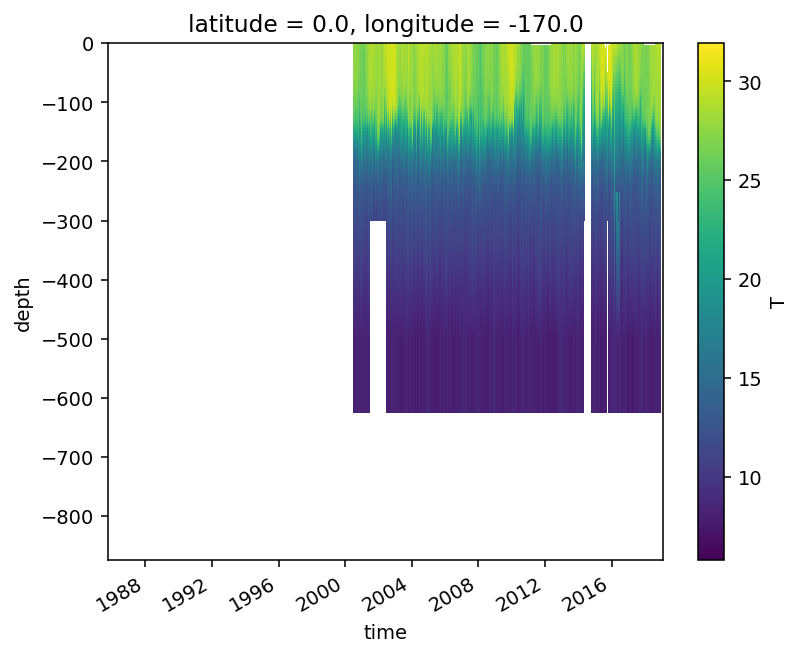

In [ ]:
tao.T.sel(longitude=-170).plot(x="time")

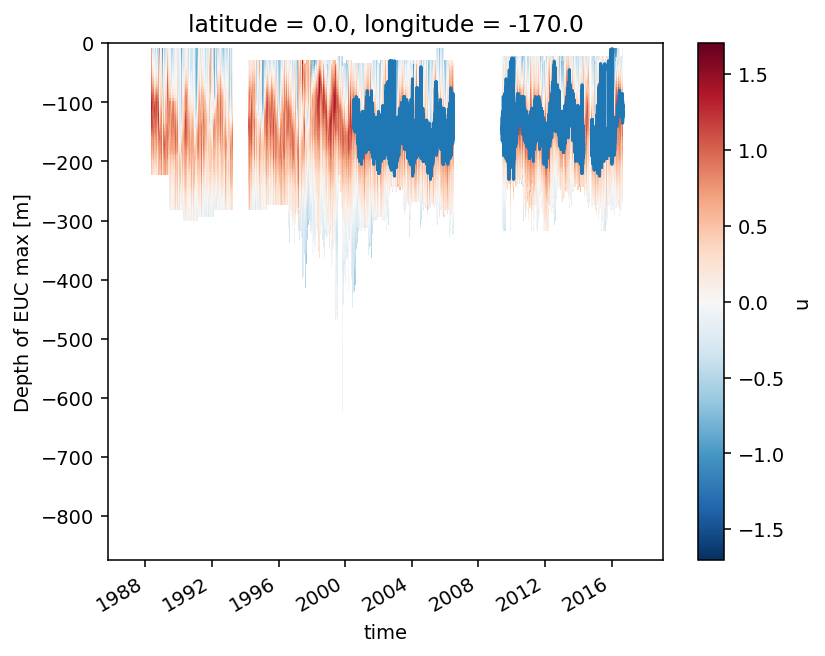

In [ ]:
tao.u.sel(longitude=-170).plot(x="time")
tao.eucmax.sel(longitude=-170).plot(x="time")

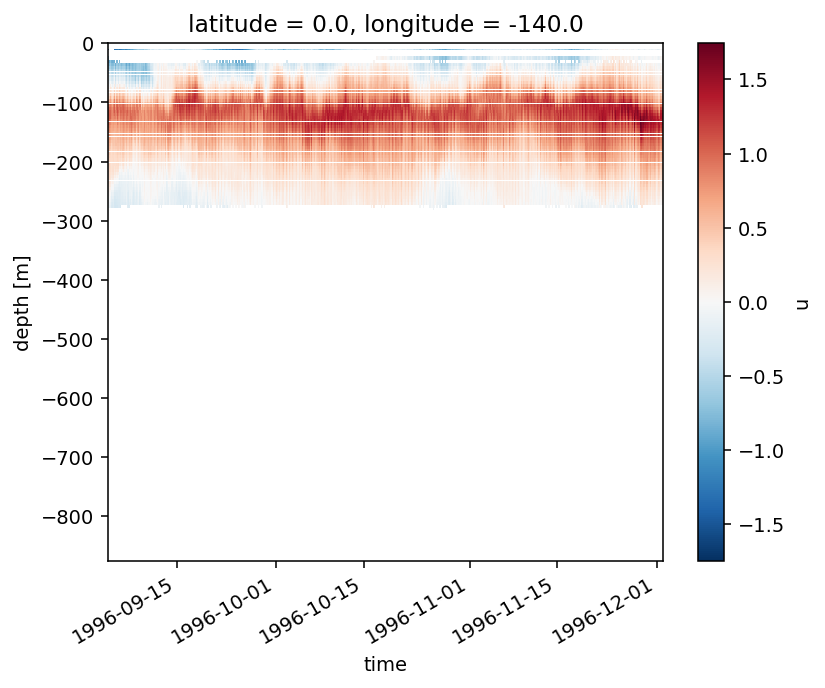

In [ ]:
tao.u.sel(longitude=-140, time=slice("1996-09-04", "1996-12-01")).plot(x="time")

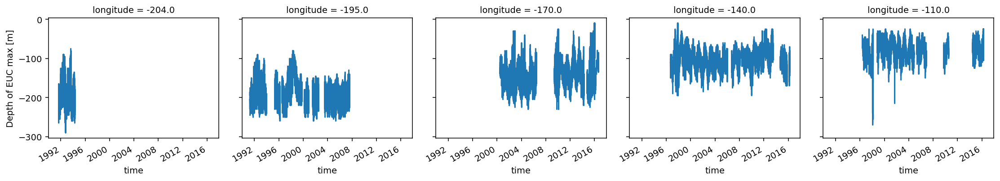

In [ ]:
tao.eucmax.plot.line(x="time", col="longitude")

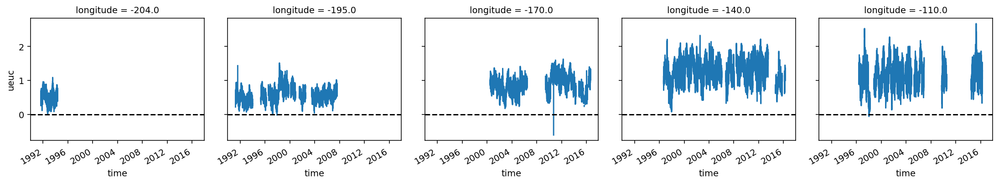

In [ ]:
fg = tao.ueuc.plot(x="time", col="longitude")
fg.map(lambda: plt.gca().axhline(0, color='k', ls='--'))

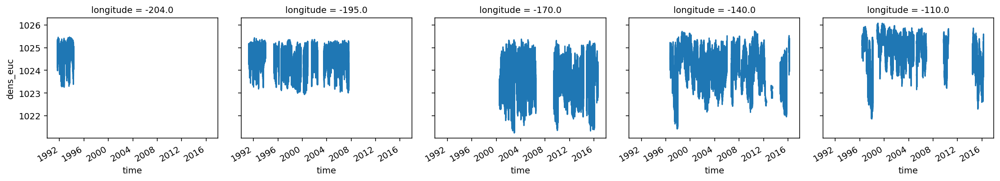

In [ ]:
tao.dens_euc.compute().plot.line(x="time", col="longitude")

In [ ]:
Ri.to_netcdf("rib-median-rig.nc")

### Estimate and plot histograms

In [ ]:
Ri = xr.load_dataset("rib-median-rig.nc")
Ri

<xarray.Dataset>
Dimensions:    (longitude: 5, time: 292267)
Coordinates:
    deepest    (time, longitude) float64 nan nan nan nan nan ... nan nan nan nan
    eucmax     (time, longitude) float64 nan nan nan nan nan ... nan nan nan nan
    latitude   float64 0.0
  * longitude  (longitude) float32 -204.0 -195.0 -170.0 -140.0 -110.0
    mld        (time, longitude) float64 nan nan nan nan nan ... nan nan nan nan
  * time       (time) datetime64[ns] 1985-10-01T06:00:00 ... 2019-02-03
    quantile   float64 0.5
Data variables:
    bulk       (time, longitude) float64 nan nan nan nan nan ... nan nan nan nan
    gradient   (time, longitude) float64 nan nan nan nan nan ... nan nan nan nan
    season     (time) object 'SON' 'SON' 'SON' 'SON' ... 'DJF' 'DJF' 'DJF' 'DJF'

In [ ]:
def plot_Ri_histograms(Ri_hist, **kwargs):

    if "season" in Ri_hist:
        kwargs.setdefault("row", "season")

    fg = Ri_hist.where(Ri_hist > 0).plot(
        col="longitude",
        x="bulk_bin",
        y="gradient_bin",
        xscale="log",
        yscale="log",
        cmap=mpl.cm.BuGn,
        cbar_kwargs={
            "orientation": "horizontal",
            # "label": "probability density",
            "aspect": 40,
            "shrink": 0.6,
            "pad": 0.1,
        },
        **kwargs
    )

    def mark_lines():
        lstyle = dict(zorder=10, lw=0.5)
        dcpy.plots.linex([0.25, 1], ax=plt.gca(), **lstyle)
        dcpy.plots.liney([0.25, 1], ax=plt.gca(), **lstyle)
        plt.gca().set_aspect(1)
        dcpy.plots.line45(ax=plt.gca(), **lstyle)

    fg.set_xlabels("$Ri_b$")
    fg.set_ylabels("$Ri_g$")
    fg.fig.set_size_inches((8, 8))
    fg.map(mark_lines)

    fg.map_dataarray(
        xr.plot.contour,
        x="bulk_bin",
        y="gradient_bin",
        colors="w",
        levels=np.linspace(*np.nanpercentile(Ri_hist, [99.1, 99.9]), 3),
        linewidths=0.3,
        add_colorbar=False,
    )

    return fg

At hourly timescales this is pretty noisy. Bulk Ri in the central Pac is O(10) when calculated from annual means. I have to show that Rib_b is a reasonable estimate of the median Ri_g over some long time scale?

In [ ]:
Ri.bulk.clip?

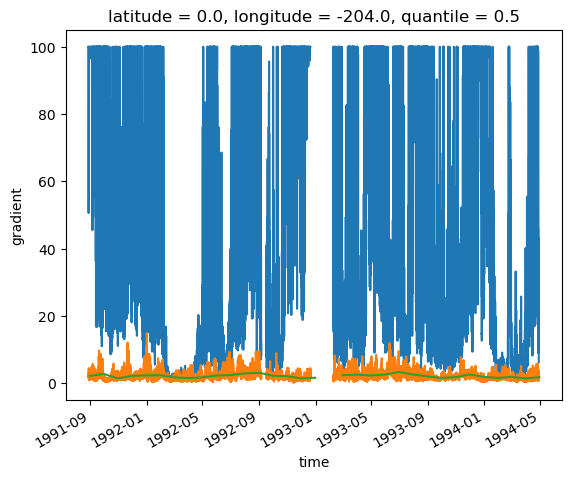

In [ ]:
lon = -204

Ri.bulk.clip(min=0, max=100).sel(longitude=lon).plot(x="time")
# Ri.bulk.clip(max=100).resample(time="M").mean().sel(longitude=lon).plot(x="time")

Ri.gradient.clip(max=100).sel(longitude=lon).plot(x="time")
Ri.gradient.clip(max=100).resample(time="M").mean().sel(longitude=lon).plot(x="time")

/gpfs/u/home/dcherian/python/xarray/xarray/core/dataarray.py:695: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  return key in self.data
/gpfs/u/home/dcherian/python/xarray/xarray/plot/plot.py:966: UserWarning: No contour levels were found within the data range.
  primitive = ax.contour(x, y, z, **kwargs)


/glade/u/home/dcherian/miniconda3/envs/dcpy/lib/python3.6/site-packages/matplotlib/colors.py:1110: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


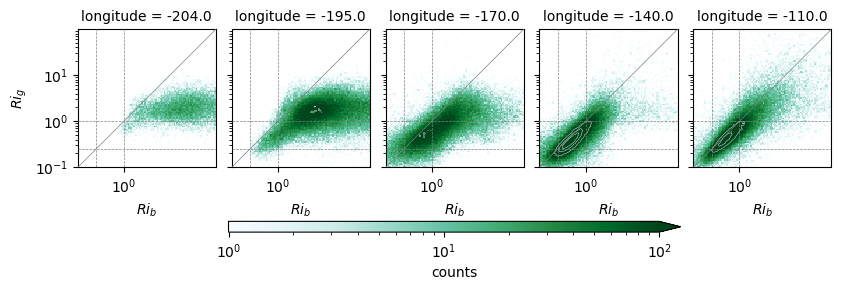

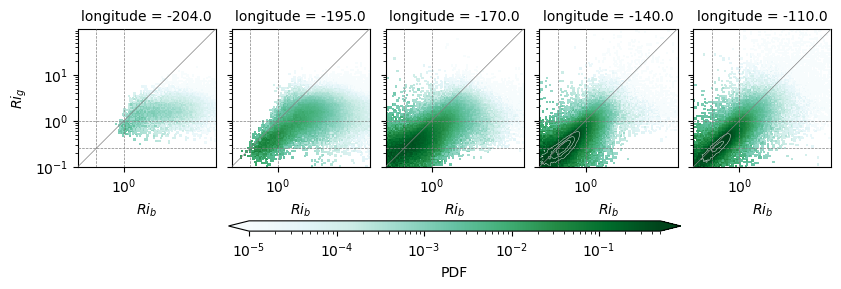

In [ ]:
def wrap_hist(ds, density=True):
    from xhistogram.xarray import histogram

    hist_over = ("time",)

    xbins = xr.DataArray(np.logspace(-1, 2, 100), dims="bulk_bin")
    ybins = xr.DataArray(np.logspace(-1, 2, 100), dims="gradient_bin")
    counts = histogram(
        ds.bulk, ds.gradient, dim=hist_over, bins=[xbins.values, ybins.values],
    )

    if density:
        dens = (
            counts
            / xbins.diff("bulk_bin")
            / ybins.diff("gradient_bin")
            / counts.sum(set(counts.dims) - set(hist_over))
        )
        dens.name = "PDF"
    else:
        dens = counts
        dens.name = "counts"
    return dens


plot_Ri_histograms(
    wrap_hist(Ri, density=False), norm=mpl.colors.LogNorm(vmin=1, vmax=100),
)
plot_Ri_histograms(
    wrap_hist(Ri, density=True), norm=mpl.colors.LogNorm(vmin=1e-5, vmax=0.5),
)

/gpfs/u/home/dcherian/python/xarray/xarray/core/dataarray.py:695: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  return key in self.data
/gpfs/u/home/dcherian/python/xarray/xarray/plot/plot.py:966: UserWarning: No contour levels were found within the data range.
  primitive = ax.contour(x, y, z, **kwargs)


/glade/u/home/dcherian/miniconda3/envs/dcpy/lib/python3.6/site-packages/matplotlib/colors.py:1110: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


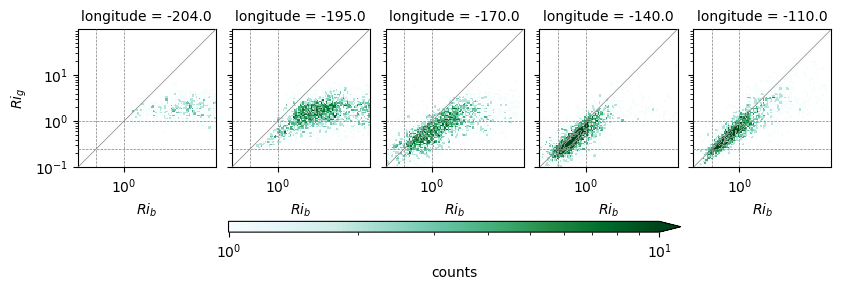

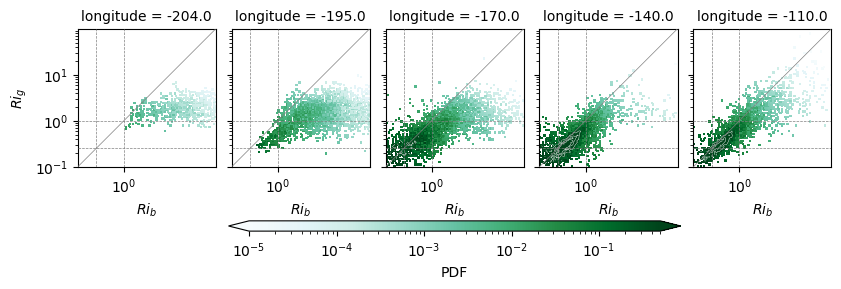

In [ ]:
reduced_Ri = (Ri.drop("season")
    .map(lambda x: x.clip(min=0, max=100))
    .resample(time="D")
    .median())

plot_Ri_histograms(
    wrap_hist(reduced_Ri, density=False), norm=mpl.colors.LogNorm(vmin=1, vmax=10),
)
plot_Ri_histograms(
    wrap_hist(reduced_Ri, density=True), norm=mpl.colors.LogNorm(vmin=1e-5, vmax=0.5),
)

### seasonal Rib vs Rig

In [ ]:
Ri_seasonal_hist = (
    Ri.groupby("season").apply(wrap_hist).reindex(season=["DJF", "MAM", "JJA", "SON"])
)
Ri_seasonal_hist

<xarray.DataArray 'histogram_bulk_gradient' (season: 4, longitude: 5, bulk_bin: 49, gradient_bin: 49)>
array([[[[ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         ...,
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0]],

        [[ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         ...,
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  2, ...,  0,  0,  0]],

        [[ 1,  3,  3, ...,  0,  0,  0],
         [12,  1,  3, ...,  0,  0,  0],
         [ 4,  4,  2, ...,  0,  0,  0],
         ...,
         [ 0,  1,  0, ...,  1,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0]],

        [[ 3,  6,  8, ...,  0,  0,  0],
         [ 7,  9,  9, ...,  0,  0,  0],
         [12, 20, 13, ...,  0,  0,  0],
         ...,
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  1, ...,  1,  0,  0]],

        [[ 2,  8,  2, ...,  0,  0,  0],
         [ 7,  4,  3, ...,  0,  0,  0],
         [ 6,  2,  4, ...,  0,  0,  0],
         ...,
         [ 0,  0,  0, ...,  1,  1,  0],
         [ 0,  0,  0, ...,  1,  1,  0],
         [ 0,  0,  0, ...,  2,  0,  1]]],


       [[[ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         ...,
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0]],

        [[ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         ...,
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  1,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0]],

        [[ 1,  0,  3, ...,  0,  0,  0],
         [ 0,  1,  2, ...,  0,  0,  0],
         [ 2,  1,  1, ...,  0,  0,  0],
         ...,
         [ 0,  0,  0, ...,  2,  1,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  1,  0]],

        [[ 0,  5,  5, ...,  0,  0,  0],
         [ 2,  4,  8, ...,  0,  0,  0],
         [ 3,  4,  3, ...,  0,  0,  0],
         ...,
         [ 0,  0,  0, ...,  0,  1,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0]],

        [[ 2,  2,  7, ...,  0,  1,  0],
         [ 3,  6,  6, ...,  0,  0,  0],
         [ 3,  2, 11, ...,  0,  0,  0],
         ...,
         [ 0,  0,  0, ...,  1,  2,  1],
         [ 0,  0,  0, ...,  2,  1,  3],
         [ 0,  0,  0, ...,  4,  2,  1]]],


       [[[ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         ...,
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  1],
         [ 0,  0,  0, ...,  0,  0,  0]],

        [[ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         ...,
         [ 0,  0,  0, ...,  1,  0,  0],
         [ 0,  0,  0, ...,  0,  1,  0],
         [ 0,  0,  0, ...,  0,  0,  0]],

        [[ 1,  2,  4, ...,  0,  0,  0],
         [ 2,  3,  2, ...,  0,  0,  0],
         [ 5,  1,  5, ...,  0,  0,  0],
         ...,
         [ 0,  0,  0, ...,  1,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  1],
         [ 0,  0,  0, ...,  0,  0,  0]],

        [[ 2,  5,  5, ...,  0,  0,  0],
         [ 2,  7,  5, ...,  0,  0,  0],
         [ 4,  2, 10, ...,  0,  0,  0],
         ...,
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  0]],

        [[ 4,  5,  5, ...,  0,  0,  0],
         [ 4,  5,  5, ...,  0,  0,  0],
         [ 3,  7,  4, ...,  0,  0,  0],
         ...,
         [ 0,  0,  0, ...,  0,  0,  0],
         [ 0,  0,  0, ...,  0,  0,  1],
         [ 0,  0,  0, ...,  0,  0,  1]]],


       [[[ 0,  0,  0, ...,  0,  0,  0],
         [ 

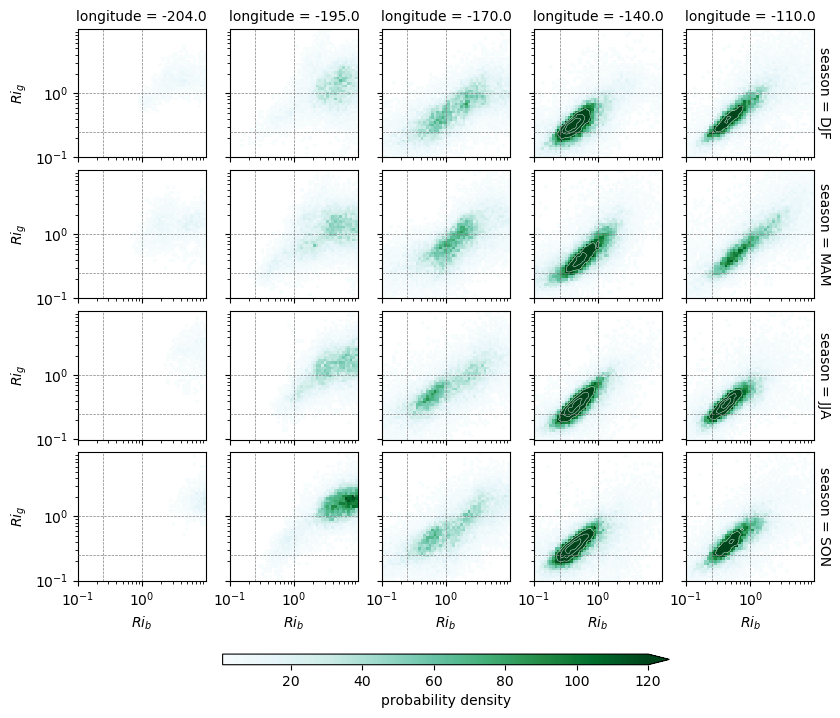

In [ ]:
fg = Ri_seasonal_hist.where(Ri_hist > 0).plot(
    row="season",
    col="longitude",
    x="bulk_bin",
    y="gradient_bin",
    robust=True,
    xscale="log",
    yscale="log",
    cmap=mpl.cm.BuGn,
    cbar_kwargs={
        "orientation": "horizontal",
        "label": "probability density",
        "aspect": 40,
        "shrink": 0.6,
        "pad": 0.1,
    },
)


def mark_lines():
    dcpy.plots.linex([0.25, 1], ax=plt.gca(), zorder=10, lw=0.5)
    dcpy.plots.liney([0.25, 1], ax=plt.gca(), zorder=10, lw=0.5)
    plt.gca().set_aspect(1)


fg.set_xlabels("$Ri_b$")
fg.set_ylabels("$Ri_g$")
fg.fig.set_size_inches((8, 8))
fg.map(mark_lines)

fg.map_dataarray(
    xr.plot.contour,
    x="bulk_bin",
    y="gradient_bin",
    colors="w",
    levels=np.linspace(*np.nanpercentile(Ri_hist, [99.1, 99.9]), 3),
    linewidths=0.3,
    add_colorbar=False,
)

fg.fig.savefig("images/gradient-bulk-ri-joint-pdf.png", dpi=200, bbox_inches="tight")

(0.1, 100)

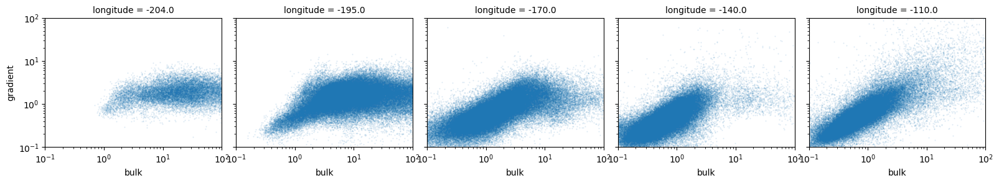

In [ ]:
mask = (
    Ri.bulk.notnull()
    & Ri.gradient.notnull()
    & (Ri.gradient < 100)
    & (Ri.bulk < 100)
    & (Ri.bulk > 0)
    & (Ri.gradient > 0)
)
masked = Ri.where(mask, drop=True)
masked["season"] = masked.time.dt.season
fg = masked.plot.scatter(
    col="longitude", x="bulk", y="gradient", s=0.5, alpha=0.1,
)
plt.gca().set_xscale("log")
plt.gca().set_yscale("log")
plt.gca().set_xlim([0.1, 100])
plt.gca().set_ylim([0.1, 100])

# fg.fig.savefig("images/bulk-vs-gradient-ri.png", dpi=180)

## Datasets

### johnson

In [ ]:
johnson = pump.obs.read_johnson().sel(latitude=0)
johnson["eucmax"] = pump.get_euc_max(johnson.u)
johnson = pump.calc.estimate_euc_depth_terms(johnson)
johnson.attrs["name"] = "Johnson"
johnson.load()

<xarray.Dataset>
Dimensions:    (depth: 50, lon_edges: 11, longitude: 10)
Coordinates:
  * longitude  (longitude) float64 -217.0 -204.0 -195.0 ... -125.0 -110.0 -95.0
  * lon_edges  (lon_edges) float64 136.5 149.5 160.5 172.5 ... 242.5 257.5 272.5
    latitude   float64 0.0
  * depth      (depth) float64 -5.0 -15.0 -25.0 -35.0 ... -475.0 -485.0 -495.0
Data variables:
    temp       (depth, longitude) float32 29.32408 29.32196 ... 8.023529
    salt       (depth, longitude) float32 34.19115 34.45227 ... 34.63364
    dens       (depth, longitude) float32 1021.3508 1021.5474 ... 1026.9829
    u          (depth, longitude) float32 0.08695984 0.1127472 ... nan nan
    TSPTS      (depth, longitude) float32 20.0 34.0 28.0 46.0 ... 47.0 38.0 24.0
    UPTS       (depth, longitude) float32 20.0 34.0 27.0 ... nan 2.362488 nan
    eucmax     (longitude) float64 -215.0 -185.0 -185.0 ... -85.0 -75.0 -65.0
    h          (longitude) float64 -190.0 -160.0 -160.0 ... -60.0 -50.0 -40.0
    us         (longitude) float32 0.04620361 0.1165466 ... 0.2585754 0.2067261
    ueuc       (longitude) float32 0.4239502 0.4944916 ... 0.9161682 0.7123413
    du         (longitude) float32 -0.37774658 -0.377945 ... -0.50561523
    dens_euc   (longitude) float64 1.026e+03 1.025e+03 ... 1.026e+03 1.026e+03
    b          (depth, longitude) float64 -9.766 -9.774 -9.776 ... -9.822 -9.822
    bs         (longitude) float64 -9.767 -9.775 -9.776 ... -9.794 -9.793 -9.795
    beuc       (longitude) float64 -9.81 -9.81 -9.81 -9.81 ... -9.81 -9.81 -9.81
    db         (longitude) float64 0.04333 0.03527 0.03391 ... 0.01668 0.01474
    Rib        (longitude) float64 57.7 39.51 37.72 10.22 ... 1.185 1.929 2.307
Attributes:
    history:  FERRET V5.41    1-Oct-02
    name:     Johnson

### TAO daily → full average

In [ ]:
# need to fill to the surface
tao_adcp = pump.obs.read_tao_adcp().mean("time").bfill("depth")
tao_adcp["eucmax"] = pump.get_euc_max(tao_adcp.u)

tao_ctd_raw = (
    pump.obs.read_tao()
    .sel(latitude=0, longitude=tao_adcp.longitude)
    .sortby("depth")
    .chunk({"depth": -1})
    .pipe(dcpy.interpolate.pchip_fillna, dim="depth")
    .drop(["u", "v"])
    .mean("time")
    .compute()
)
tao_ctd = tao_ctd.ffill("depth")
tao_ctd["dens"] = pump.mdjwf.dens(np.array(35.0), tao_ctd.temp, tao_ctd.depth)
tao_ctd["eucmax"] = tao_adcp.eucmax

tao_daily = xr.merge(
    [
        pump.calc.estimate_euc_depth_terms(tao_adcp)[
            ["h", "us", "ueuc", "du", "eucmax"]
        ],
        pump.calc.estimate_euc_depth_terms(tao_ctd)[["bs", "beuc", "db"]],
    ]
)
tao_daily = pump.calc.estimate_Rib(tao_daily)
tao_daily.attrs["name"] = "TAO"
tao_daily.load()

/glade/u/home/dcherian/pump/pump/obs.py:190: FutureWarning: In xarray version 0.15 the default behaviour of `open_mfdataset`
will change. To retain the existing behavior, pass
combine='nested'. To use future default behavior, pass
combine='by_coords'. See
http://xarray.pydata.org/en/stable/combining.html#combining-multi

  chunks={"lat": 1, "lon": 1, "depth": 5},
/gpfs/u/home/dcherian/python/xarray/xarray/backends/api.py:933: FutureWarning: The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset`) to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in future, please use the new
`combine_nested` function (or the `combine='nested'` option to
open_mfdataset).The datasets supplied require both concatenation and merging. From
xarray version 0.15 this will operation will require either using the
new `co

<xarray.Dataset>
Dimensions:    (longitude: 6)
Coordinates:
  * longitude  (longitude) float64 -213.0 -204.0 -195.0 -170.0 -140.0 -110.0
    latitude   float64 0.0
Data variables:
    h          (longitude) float32 -200.0 -175.0 -170.0 -130.0 -80.0 -50.0
    us         (longitude) float32 -0.06934669 0.093757585 ... 0.19134645
    ueuc       (longitude) float32 0.33551154 0.4491259 ... 1.0492624 0.9650307
    du         (longitude) float32 -0.40485823 -0.35536832 ... -0.77368426
    eucmax     (longitude) float32 -225.0 -200.0 -195.0 -155.0 -105.0 -75.0
    bs         (longitude) float64 -9.782 -9.783 -9.784 -9.794 -9.8 -9.801
    beuc       (longitude) float64 -9.81 -9.81 -9.81 -9.81 -9.81 -9.81
    db         (longitude) float64 0.02783 0.02671 0.02559 ... 0.01005 0.009183
    Rib        (longitude) float64 33.96 37.01 18.15 3.023 0.6735 0.767
Attributes:
    name:     TAO

### TAO hourly → average

In [ ]:
tao_clim = tao.mean("time")
tao_clim["eucmax"] = pump.calc.get_euc_max(tao_clim.u)
tao_clim = pump.calc.estimate_euc_depth_terms(tao_clim)
tao_clim.attrs["name"] = "TAO"
tao_clim.load()

NameError: name 'tao' is not defined

In [ ]:
seasonal = tao_zeuc.reset_coords().groupby("time.season")
seasonal_mean = (
    seasonal.mean()
    .where(seasonal.count() > 90 * 24)
    .reindex(season=["DJF", "MAM", "JJA", "SON"])
)
seasonal_mean.load()

<xarray.Dataset>
Dimensions:    (longitude: 5, season: 4, zeuc: 59)
Coordinates:
  * season     (season) object 'DJF' 'MAM' 'JJA' 'SON'
  * longitude  (longitude) float32 -204.0 -195.0 -170.0 -140.0 -110.0
  * zeuc       (zeuc) float64 -47.5 -42.5 -37.5 -32.5 ... 232.5 237.5 242.5
Data variables:
    Rig        (season, longitude, zeuc) float64 8.232 11.67 9.22 ... nan nan
    T          (season, longitude, zeuc) float64 13.6 13.82 14.05 ... nan nan
    deepest    (season, longitude) float64 -488.7 -470.1 ... -382.0 -440.7
    dens       (season, longitude, zeuc) float64 1.025e+03 1.025e+03 ... nan nan
    eucmax     (season, longitude) float64 3.264 4.126 9.016 ... 2.976 6.241
    latitude   (season) float32 nan nan nan nan
    mld        (season, longitude) float64 -34.32 -34.82 ... -16.38 -11.45
    u          (season, longitude, zeuc) float64 0.3643 0.389 0.4046 ... nan nan
    v          (season, longitude, zeuc) float64 -0.009484 -0.007725 ... nan nan

In [ ]:
seasonal_mean["Rig_mean"] = seasonal_mean.Rig
seasonal_mean["depth"] = seasonal_mean.eucmax + seasonal_mean.zeuc
seasonal_mean = seasonal_mean.set_coords(["eucmax", "depth"])
seasonal_mean["Rig"] = pump.calc.calc_tao_ri(seasonal_mean[["u", "v"]], seasonal_mean["T"], dim="zeuc")

/gpfs/u/home/dcherian/python/xarray/xarray/core/missing.py:329: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  ).transpose(*self.dims)
/gpfs/u/home/dcherian/python/xarray/xarray/core/missing.py:329: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  ).transpose(*self.dims)
/gpfs/u/home/dcherian/python/xarray/xarray/core/missing.py:329: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  ).transpose(*self.dims)


In [ ]:
seasonal_mean["Rig_median"] = (
    tao_zeuc.Rig.chunk({"time": -1})
    .groupby("time.season")
    .quantile(dim="time", q=0.5)
    .compute()
)

/gpfs/u/home/dcherian/python/xarray/xarray/core/common.py:664: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, the dimension order of these coordinates will be restored as well unless you specify restore_coord_dims=False.
  self, group, squeeze=squeeze, restore_coord_dims=restore_coord_dims


In [ ]:
seasonal_mean["N2"] = -9.81 / 1025 * seasonal_mean.dens.differentiate("zeuc")
seasonal_mean["S2"] = (
    seasonal_mean.u.differentiate("zeuc") ** 2
    + seasonal_mean.u.differentiate("zeuc") ** 2
)

/gpfs/u/home/dcherian/python/xarray/xarray/plot/plot.py:107: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  xplt = darray.transpose(ydim, huedim)


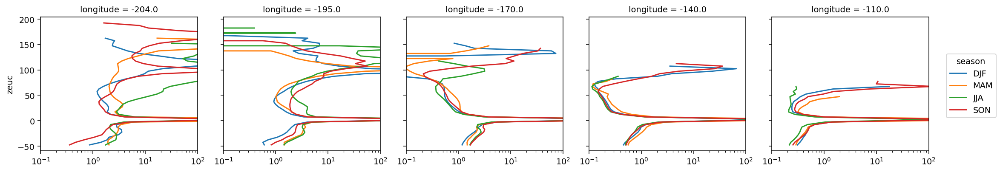

In [ ]:
(seasonal_mean.N2 / seasonal_mean.S2).plot(
    col="longitude", hue="season", y="zeuc", xlim=[0.1, 100], xscale="log"
)

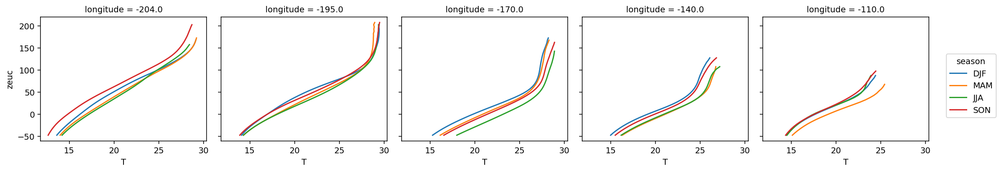

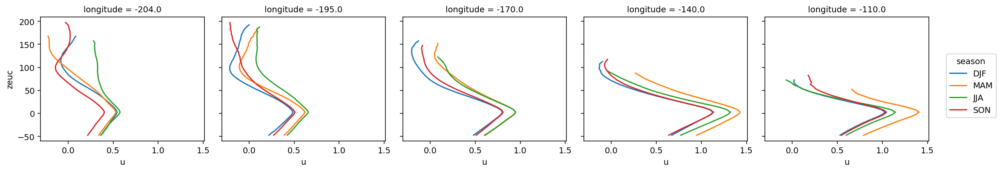

In [ ]:
(seasonal_mean.T).plot(col="longitude", hue="season", y="zeuc")
(seasonal_mean.u).plot(col="longitude", hue="season", y="zeuc")

$N²$ isn't changing that much moving eastward consistent with the bulk $Δb$. Shear $S²$ is changing significantly, again consistent

/gpfs/u/home/dcherian/python/xarray/xarray/plot/plot.py:107: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  xplt = darray.transpose(ydim, huedim)


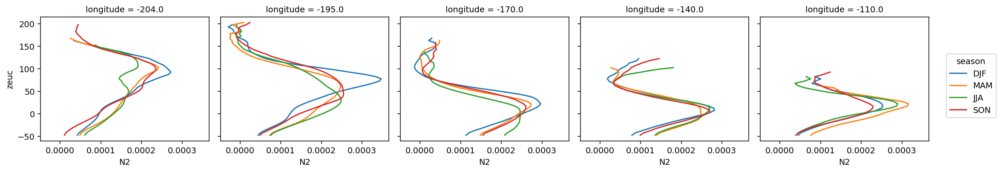

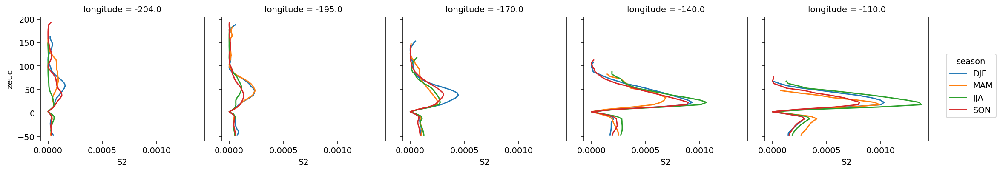

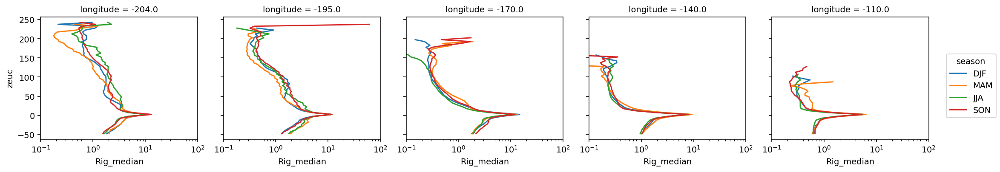

In [ ]:
(seasonal_mean.N2).plot(col="longitude", hue="season", y="zeuc")
(seasonal_mean.S2).plot(col="longitude", hue="season", y="zeuc")
(seasonal_mean.Rig_median).plot(col="longitude", hue="season", y="zeuc", xlim=[0.1, 100], xscale="log")

In [ ]:
counts = tao_zeuc.count("time").load()

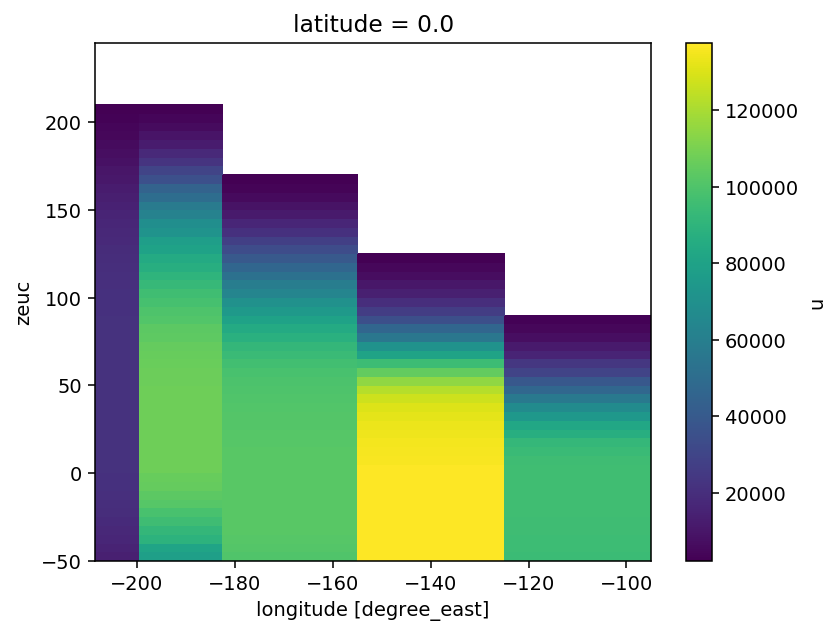

In [ ]:
counts.u.where(counts.u > 90*24).plot(x="longitude")

In [ ]:
annual_mean = tao_zeuc.groupby("time.year").mean().mean("year").load().where(counts > 90*24)

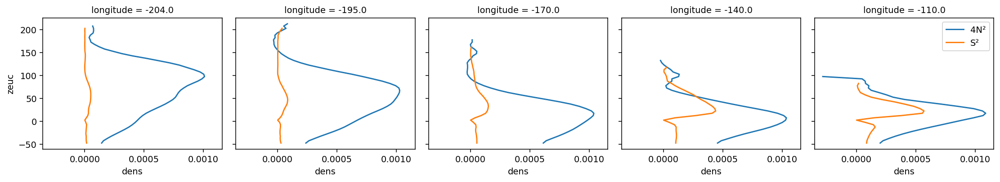

In [ ]:
fg = (4*-9.81/1025 * annual_mean.dens.differentiate("zeuc")).plot(col="longitude", y="zeuc")
S2 = annual_mean.u.differentiate("zeuc")**2 + annual_mean.v.differentiate("zeuc")**2
for loc, ax in zip(fg.name_dicts.flat, fg.axes.flat):
    ax.plot(S2.sel(loc), S2.zeuc)
    # ax.set_xscale("log")
    
ax.legend(["4N²", "S²"])

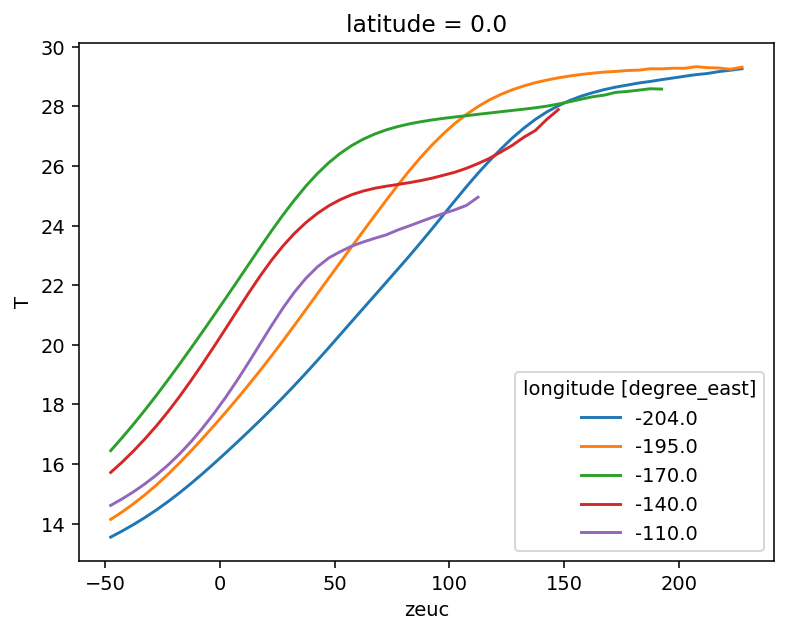

In [ ]:
counts = tao_zeuc.count("time")
tao_zeuc = tao_zeuc.where(counts > 30*24)

In [ ]:
zeuc_clim = pump.calc.calc_tao_ri(dim="zeuc")

<xarray.Dataset>
Dimensions:    (longitude: 5, zeuc: 59)
Coordinates:
    latitude   float32 ...
  * longitude  (longitude) float32 -204.0 -195.0 -170.0 -140.0 -110.0
  * zeuc       (zeuc) float64 -47.5 -42.5 -37.5 -32.5 ... 232.5 237.5 242.5
Data variables:
    Rig        (longitude, zeuc) float64 dask.array<chunksize=(1, 59), meta=np.ndarray>
    T          (longitude, zeuc) float64 dask.array<chunksize=(1, 59), meta=np.ndarray>
    dens       (longitude, zeuc) float64 dask.array<chunksize=(1, 59), meta=np.ndarray>
    u          (longitude, zeuc) float64 dask.array<chunksize=(1, 59), meta=np.ndarray>
    v          (longitude, zeuc) float64 dask.array<chunksize=(1, 59), meta=np.ndarray>

## Figure 5

In [ ]:
tao_zeuc = xr.open_zarr("tao-zeuc.zarr")
tao_zeuc

<xarray.Dataset>
Dimensions:    (longitude: 5, time: 292267, zeuc: 59)
Coordinates:
    deepest    (time, longitude) float64 dask.array<chunksize=(10000, 1), meta=np.ndarray>
    eucmax     (time, longitude) float64 dask.array<chunksize=(10000, 1), meta=np.ndarray>
    latitude   float32 ...
  * longitude  (longitude) float64 -204.0 -195.0 -170.0 -140.0 -110.0
    mld        (time, longitude) float64 dask.array<chunksize=(10000, 1), meta=np.ndarray>
  * time       (time) datetime64[ns] 1985-10-01T06:00:00 ... 2019-02-03
  * zeuc       (zeuc) float64 -47.5 -42.5 -37.5 -32.5 ... 232.5 237.5 242.5
Data variables:
    Rig        (time, longitude, zeuc) float64 dask.array<chunksize=(10000, 1, 59), meta=np.ndarray>
    T          (time, longitude, zeuc) float64 dask.array<chunksize=(10000, 1, 59), meta=np.ndarray>
    dens       (time, longitude, zeuc) float64 dask.array<chunksize=(10000, 1, 59), meta=np.ndarray>
    u          (time, longitude, zeuc) float64 dask.array<chunksize=(10000, 1, 59), meta=np.ndarray>
    v          (time, longitude, zeuc) float64 dask.array<chunksize=(10000, 1, 59), meta=np.ndarray>

In [ ]:
ri = tao_zeuc.Rig.compute().median("time")

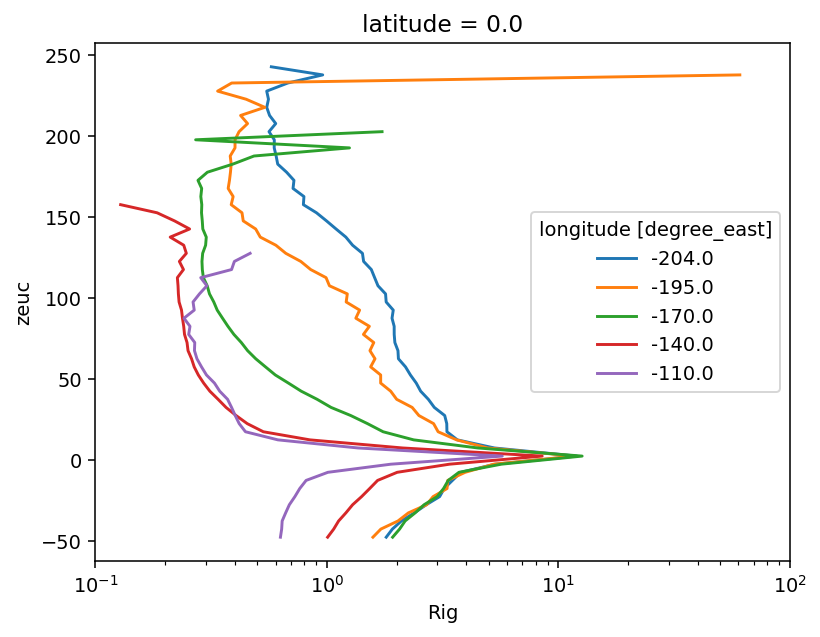

In [ ]:
ri.plot(hue="longitude", y="zeuc", xscale="log", xlim=(0.1,100))

In [ ]:
tao_zeuc = tao_zeuc.where(tao_zeuc.count("time") > 90 * 24)
Ri_q_annual = (
    tao_zeuc.Rig.sel(zeuc=slice(0, None))
    .chunk({"time": -1, "zeuc": -1})
    .quantile(q=[0.25, 0.5, 0.75], dim=["time", "zeuc"])
)
Ri_q_annual.load()

<xarray.DataArray 'Rig' (quantile: 3, longitude: 5)>
array([[0.81522617, 0.58695033, 0.26694281, 0.22278418, 0.26821389],
       [1.97553892, 1.58871084, 0.70549343, 0.41711624, 0.54069482],
       [5.45856488, 4.62699244, 2.61483129, 1.18364173, 1.5925003 ]])
Coordinates:
  * longitude  (longitude) float64 -204.0 -195.0 -170.0 -140.0 -110.0
  * quantile   (quantile) float64 0.25 0.5 0.75

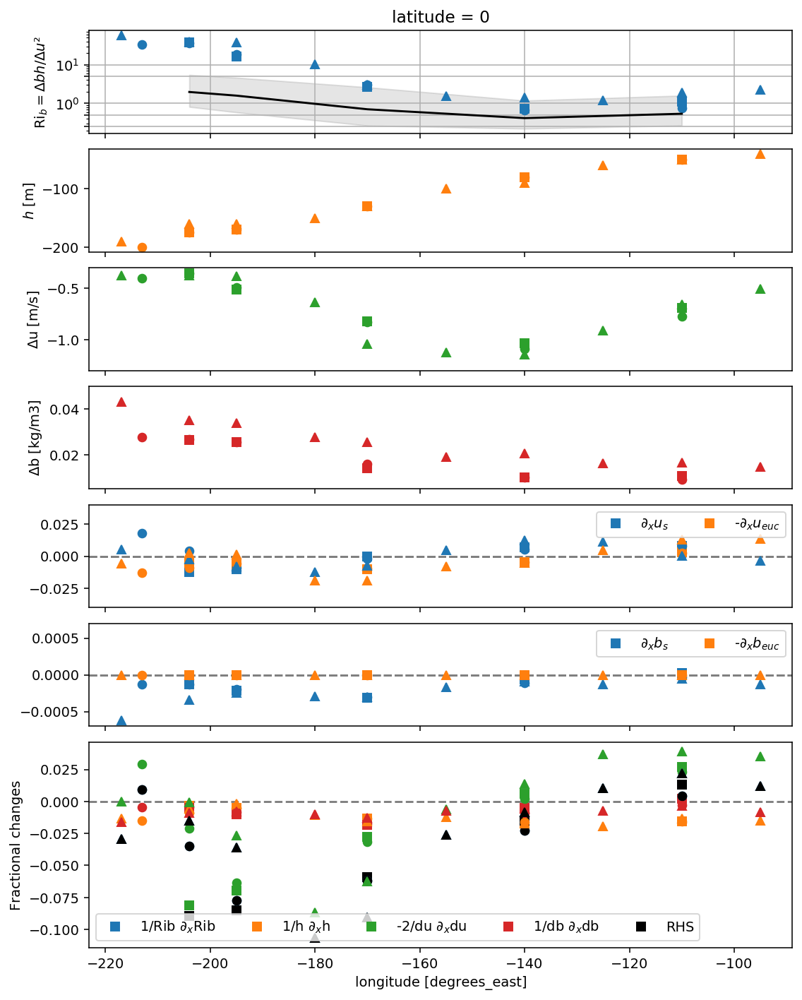

In [ ]:
f, ax = pump.plot.plot_bulk_Ri_diagnosis(tao_clim, ls="none", marker= 's')
pump.plot.plot_bulk_Ri_diagnosis(tao_daily, ls="none", marker= 'o', f=f, ax=ax)
pump.plot.plot_bulk_Ri_diagnosis(johnson, ls="none", marker= '^', f=f, ax=ax)
# ri.sel(zeuc=slice(0,None)).mean("zeuc").plot(ax=ax["Rib"], color='k')

dccpy.plots.fill_between(
    Ri_q_annual.sel(quantile=[0.25, 0.75]),
    axis="y",
    y="quantile",
    x="longitude",
    alpha=0.1,
    ax=ax["Rib"],
    color='k'
)
Ri_q_annual.sel(quantile=0.5).plot(color='k', ax=ax["Rib"], _labels=False)
# pump.plot.plot_bulk_Ri_diagnosis(johnson, ls="none", marker= '^', f=f, ax=ax)

In [ ]:
tao = pump.obs.read_tao_zarr("ancillary")
tao

<xarray.Dataset>
Dimensions:    (depth: 101, longitude: 5, time: 292267)
Coordinates:
    deepest    (time, longitude) float64 dask.array<chunksize=(10000, 1), meta=np.ndarray>
  * depth      (depth) float64 -500.0 -495.0 -490.0 -485.0 ... -10.0 -5.0 0.0
    eucmax     (time, longitude) float64 dask.array<chunksize=(10000, 1), meta=np.ndarray>
    latitude   float32 ...
  * longitude  (longitude) float64 -204.0 -195.0 -170.0 -140.0 -110.0
    mld        (time, longitude) float64 dask.array<chunksize=(10000, 1), meta=np.ndarray>
  * time       (time) datetime64[ns] 1985-10-01T06:00:00 ... 2019-02-03
    zeuc       (depth, time, longitude) float64 dask.array<chunksize=(101, 10000, 1), meta=np.ndarray>
Data variables:
    Rig        (time, longitude, depth) float64 dask.array<chunksize=(10000, 1, 101), meta=np.ndarray>
    T          (time, longitude, depth) float64 dask.array<chunksize=(10000, 1, 101), meta=np.ndarray>
    dens       (time, longitude, depth) float64 dask.array<chunksize=(10000, 1, 101), meta=np.ndarray>
    u          (time, depth, longitude) float32 dask.array<chunksize=(10000, 101, 1), meta=np.ndarray>
    v          (time, depth, longitude) float32 dask.array<chunksize=(10000, 101, 1), meta=np.ndarray>

In [ ]:
tao_bulked = pump.calc.estimate_euc_depth_terms(tao)
tao

/gpfs/u/home/dcherian/python/xarray/xarray/core/missing.py:393: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  ).transpose(*arr.dims)


,Array,Chunk
Bytes,1.18 GB,8.08 MB
Shape,"(292267, 5, 101)","(10000, 1, 101)"
Count,151 Tasks,150 Chunks
Type,float64,numpy.ndarray
,Array,Chunk
Bytes,1.18 GB,8.08 MB
Shape,"(292267, 5, 101)","(10000, 1, 101)"
Count,151 Tasks,150 Chunks
Type,float64,numpy.ndarray
,Array,Chunk


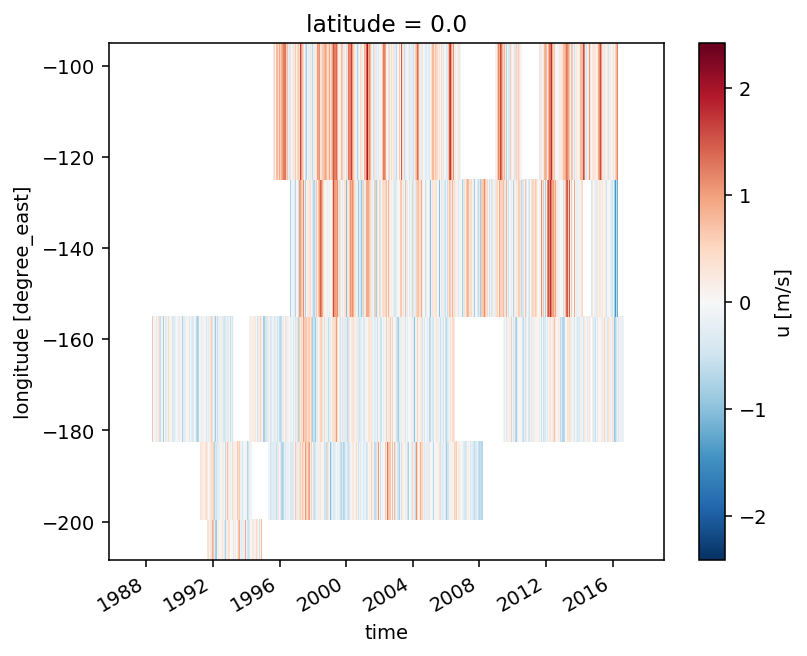

In [ ]:
tao.us.plot(x="time")